# Load necessary packages

In [3]:
import pandas as pd 
import numpy as np 
import glob 
import os
import math
import pickle as pkl 
from scipy.stats import fisher_exact, pearsonr
import plotly.graph_objects as go 
import plotly.express as px
from plotly.subplots import make_subplots
from collections import Counter, defaultdict
from goatools.obo_parser import GODag
from goatools.go_enrichment import GOEnrichmentStudy
from statistics import median

# Load data

In [5]:
ORGANISMS = ["ECOLI", "YEAST", "CANAL", "ARATH", "MAIZE", "ORYSJ", "SOYBN", "DROME", "CAEEL", "MOUSE", "HUMAN"]
PROT_PATH = "../../data/proteins"
RESULTS_PATH = "../../results"
DB_PATH = "../../../Pocketeome/db_files"

GOA_PATH = "../../../Pocketeome/db_files/GOA"
GO_DF = pd.read_csv(f"{GOA_PATH}/all_proteins.gpa")
GO_DICT = GO_DF.groupby("Object_ID")["GO_ID"].apply(list).to_dict()

PLDDT_PATH = "../../results/proteins/plddt_dict.pkl"
PLDDT_DICT = pkl.load(open(PLDDT_PATH, "rb"))

SEQ_PATH = "../../results/proteins/seq_len_dict.pkl"
SEQ_DICT = pkl.load(open(SEQ_PATH, "rb"))

FS_PATH = "../../../foldseek/fs_clust_proteins.pkl"
FS_DICT = pkl.load(open(FS_PATH, "rb"))

FRAG_DICT = {}
ORG_DICT = {}
results = {}
for org in ORGANISMS: 
    print(org)
    prot_list = [os.path.basename(prot_file)[3:-4] 
                 for prot_file in glob.glob(f"{PROT_PATH}/{org}/*pdb")]
    with open(f"{RESULTS_PATH}/bind_dict/{org}_pockets.pkl", "rb") as bind_file:
        bind_dict = pkl.load(bind_file)
    prot_w_bs = {prot[3:] for prot, pockets in bind_dict.items() if pockets}
    pockets = [pocket for pockets in bind_dict.values() for pocket in pockets]
    ORG_DICT[org] = {"#pockets": len(pockets)}
    mobi_df = pd.read_csv(f"{DB_PATH}/{org}/mobidb.csv")
    mobi_dict = mobi_df.set_index("entry")["ratio"].to_dict()
    tm_dict = pkl.load(open(f"../../results/pocket_desc/{org}/{org}_tm_info.pkl", "rb"))
    # seq_len_dict = mobi_df.set_index("entry")["len_seq"].to_dict()
    is_plant = False
    if org in ["ARATH", "MAIZE", "ORYSJ", "SOYBN"]:
        is_plant = True
    for prot in prot_list: 
        frag_file = f"{DB_PATH}/{org}/frag_df.tsv.gz"
        if os.path.isfile(frag_file):
            frag_df = pd.read_csv(frag_file, sep="\t", compression="gzip")
            frag_list = frag_df["Entry"].to_list()
        else:
            frag_list = []
        has_bs = prot in prot_w_bs
        disorder = mobi_dict.get(prot, None)
        not_in_mobi = False
        if not disorder:
            not_in_mobi = True
            disorder = 0
        seq_len = SEQ_DICT.get(prot, None)
        plddt = PLDDT_DICT.get(prot, None)
        tm_info = tm_dict.get(prot, None)
        if tm_info: 
            tm_info = tm_info["num_passed"]
        else: 
            tm_info = 10
        fs = FS_DICT.get(prot, None)
        if not fs or seq_len < 100 or tm_info < 6 or prot in frag_list: 
            continue
        fs_clust, clu_flag, is_dark, n_mem = fs["clusterID"], fs['cluFlag'], fs["isDark"], fs["nMem"]
        go_terms = GO_DICT.get(prot, None)
        results[prot] = {"org": org,
                         "has_bs": has_bs,
                         "disorder": disorder,
                         "#aa": seq_len,
                         "plddt": plddt,
                         "go_terms": go_terms,
                         "fs_clust": fs_clust,
                         "clu_flag": clu_flag,
                         "n_mem": n_mem,
                         "is_dark": is_dark,
                         "not_in_mobi": not_in_mobi,
                         "is_plant": is_plant,
                         "tm_passed": tm_info
                        }

results = pd.DataFrame.from_dict(results, orient="Index").reset_index()
results = results.sort_values(by="org")
results["no_go"] = results["go_terms"].isna()
print(len(results))
# results = results[~results["clu_flag"].isna()]
print(len(results))
results.head()

/tmp/ipykernel_13928/705963213.py:7: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  GO_DF = pd.read_csv(f"{GOA_PATH}/all_proteins.gpa")


ECOLI
YEAST
CANAL
ARATH
MAIZE
ORYSJ
SOYBN
DROME
CAEEL
MOUSE
HUMAN
223091
223091


,index,org,has_bs,disorder,#aa,plddt,go_terms,fs_clust,clu_flag,n_mem,is_dark,not_in_mobi,is_plant,tm_passed,no_go
32210,Q9C659,ARATH,False,0.852,162,53.30,[GO:0008150],Q9C659,2,2.0,1.0,False,True,7,False
26554,F4K452,ARATH,True,0.165,395,81.16,"[GO:0020037, GO:0009507, GO:0009534, GO:000953...",A0A7S2Y5K6,1,29.0,0.0,False,True,10,False
26555,Q01909,ARATH,False,0.202,386,78.81,"[GO:0015986, GO:0046933, GO:0045261, GO:000950...",A0A384DA10,1,125.0,0.0,False,True,10,False
26556,Q8GYD9,ARATH,True,0.202,1002,75.85,"[GO:0035194, GO:0005515, GO:0005515, GO:003257...",Q2KFA1,1,308.0,0.0,False,True,10,False
26557,Q84Q60,ARATH,False,0.669,302,56.86,[GO:0008150],V4MLM9,2,4.0,1.0,False,True,10,False


In [7]:
for org in ORGANISMS: 
    tmp = results[results["org"] == org]
    num_pockets = ORG_DICT.get(org).get("#pockets")
    num_fs = len(set(tmp["fs_clust"]))
    ORG_DICT[org]["#FS_clust"] = num_fs
    ORG_DICT[org]["#pockets"] = num_pockets
    pocket_per_prot = num_pockets/len(tmp)
    print(f"Pockets per protein ratio of {org}: {round(pocket_per_prot, 3)}, number of FS cluster: {num_fs}, number of predicted pockets: {num_pockets}, number of proteins: {len(tmp)}")

Pockets per protein ratio of ECOLI: 0.694, number of FS cluster: 3010, number of predicted pockets: 2648, number of proteins: 3813
Pockets per protein ratio of YEAST: 0.534, number of FS cluster: 4730, number of predicted pockets: 3000, number of proteins: 5623
Pockets per protein ratio of CANAL: 0.556, number of FS cluster: 4930, number of predicted pockets: 3124, number of proteins: 5622
Pockets per protein ratio of ARATH: 0.447, number of FS cluster: 14325, number of predicted pockets: 11075, number of proteins: 24778
Pockets per protein ratio of MAIZE: 0.375, number of FS cluster: 20896, number of predicted pockets: 13177, number of proteins: 35165
Pockets per protein ratio of ORYSJ: 0.346, number of FS cluster: 21379, number of predicted pockets: 10618, number of proteins: 30708
Pockets per protein ratio of SOYBN: 0.44, number of FS cluster: 20476, number of predicted pockets: 20915, number of proteins: 47539
Pockets per protein ratio of DROME: 0.474, number of FS cluster: 9652, n

# Proteins with and without binding sites

Lowest median pLDDT for proteins with binding site: ('MAIZE', 81.05)
Median for ORYSJ: 67.24, median range for all other organisms: [68.85, 91.41]


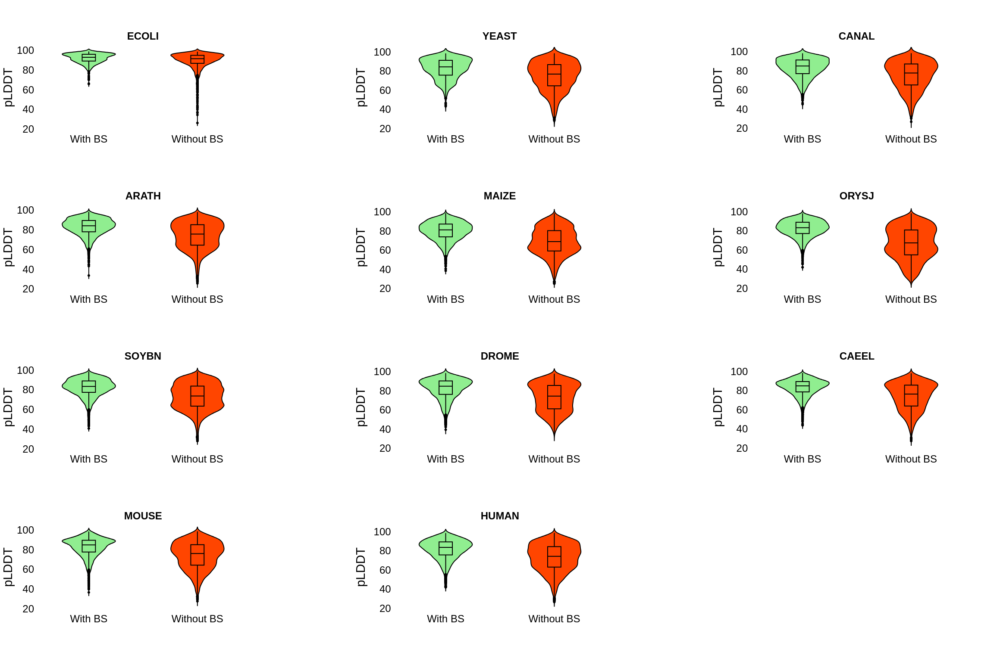

In [ ]:
ORG_TITLES = [f"<b>{org}</b>" for org in ORGANISMS]
n_row = 4
n_col = 3
fig = make_subplots(rows = n_row, cols = n_col, subplot_titles=ORG_TITLES, shared_yaxes="columns", horizontal_spacing=0.15)
prop = "plddt"
prop_name = "pLDDT"
row = 1
col = 1

medians = []
lowest_with = (None, 100) 
for org in ORGANISMS: 
    tmp = results[(results["org"] == org) & (results["has_bs"] == True)] 
    fig.add_trace(go.Violin(y = tmp[prop], box_visible = True, line_color = "black", 
                            fillcolor = "lightgreen", x0="With BS"), row = row, col= col)
    if lowest_with[1] > tmp[prop].median(): 
        lowest_with = (org, tmp[prop].median())
    tmp = results[(results["org"] == org) & (results["has_bs"] == False)] 
    fig.add_trace(go.Violin(y = tmp[prop], box_visible = True, line_color = "black", 
                            fillcolor = "orangered", x0="Without BS"), row = row, col= col)
    if org != "ORYSJ": 
        medians.append(tmp[prop].median())
    else: 
        orysj_med = tmp[prop].median()
    if col == n_col: 
        row += 1
        col = 1
    else: 
        col += 1

print(f"Lowest median pLDDT for proteins with binding site: {lowest_with}")
print(f"Median for ORYSJ: {orysj_med}, median range for all other organisms: [{min(medians)}, {max(medians)}]")
fig.update_layout(width= 2250, height = 2625,
                  font=dict(size=10, color="black"),
                  plot_bgcolor='white',
                 showlegend = False)
fig.update_yaxes(title= prop_name,
                title_standoff=0.1)
fig.update_annotations(font_size=12)
fig.write_image("../../results/pictures/prot_plddt.png")
fig.show()

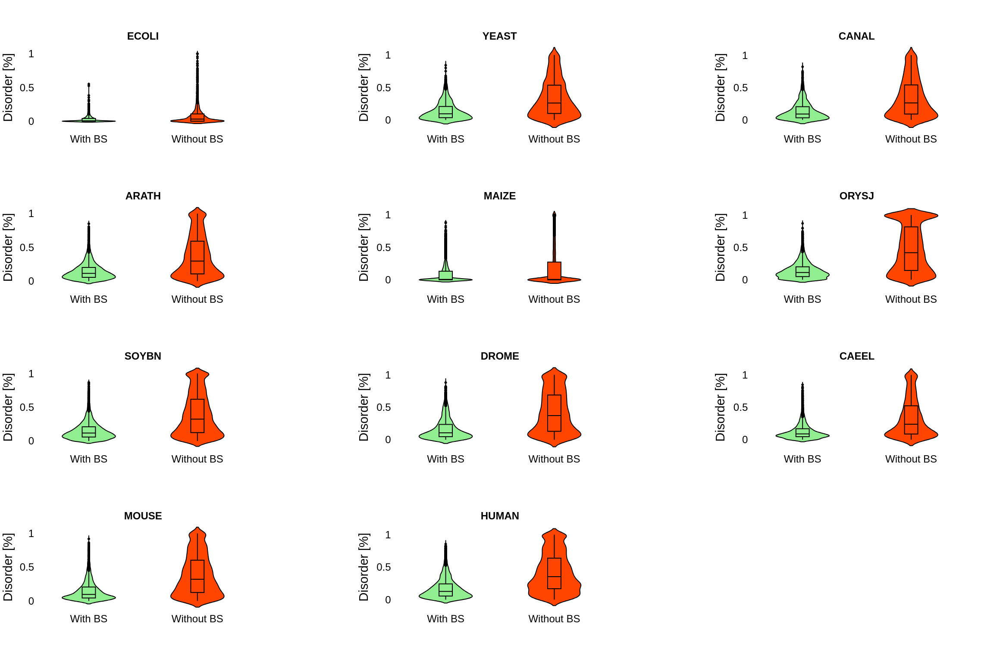

In [ ]:
n_row = 4
n_col = 3
fig = make_subplots(rows = n_row, cols = n_col, subplot_titles=ORG_TITLES, shared_yaxes="columns", horizontal_spacing=0.15)
prop = "disorder"
prop_name = "Disorder [%]"
row = 1
col = 1

for org in ORGANISMS: 
    tmp = results[(results["org"] == org) & (results["has_bs"] == True)] 
    fig.add_trace(go.Violin(y = tmp[prop], box_visible = True, line_color = "black", 
                            fillcolor = "lightgreen", x0="With BS"), row = row, col= col)
    tmp = results[(results["org"] == org) & (results["has_bs"] == False)] 
    fig.add_trace(go.Violin(y = tmp[prop], box_visible = True, line_color = "black", 
                            fillcolor = "orangered", x0="Without BS"), row = row, col= col)
    if col == n_col: 
        row += 1
        col = 1
    else: 
        col += 1

fig.update_layout(width= 1000, height = 1500,
                  font=dict(size=24, color="black"),
                  plot_bgcolor='white',
                 showlegend = False)
fig.update_yaxes(title= prop_name,
                title_standoff=0.1)
fig.update_annotations(font_size=24)
# fig.write_image("../../results/pictures/prot_disorder.png")
fig.show()

In [ ]:
tmp = results[(results["org"] == "MAIZE") & (results["not_in_mobi"] == True)]
len(tmp)
# tmp["disorder"].mean()

20925

ECOLI 255.0
YEAST 352.0
CANAL 364.0
ARATH 320.0
MAIZE 287.0
ORYSJ 236.0
SOYBN 306.0
DROME 357.0
CAEEL 316.0
MOUSE 372.0
HUMAN 382.0
Shortest median seq len for proteins with binding site: (378.0, 'ECOLI')
Longest median seq len for proteins with binding site: (555.0, 'YEAST')
Longest median seq len for proteins without binding site: (382.0, 'HUMAN')
Median for ORYSJ: 236.0, median range for all other organisms: [255.0, 382.0]


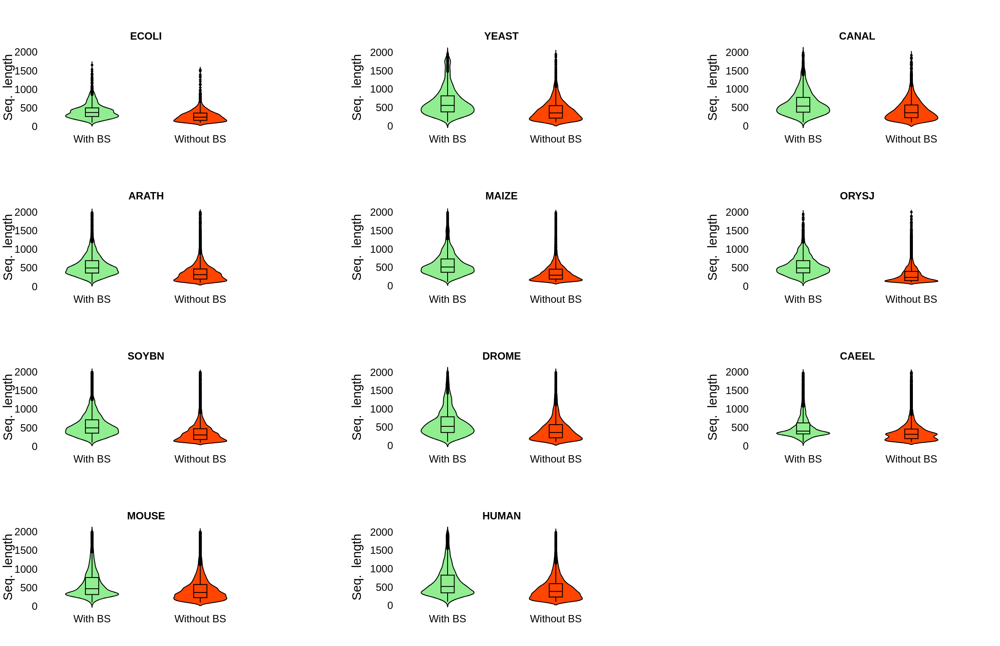

In [ ]:
n_row = 4
n_col = 3
fig = make_subplots(rows = n_row, cols = n_col, subplot_titles=ORG_TITLES, shared_yaxes="columns", horizontal_spacing=0.15)
prop = "#aa"
prop_name = "Seq.  length"
row = 1
col = 1
medians = []

longest_with = (0, None)
shortest_with = (500, None)
longest_without = (0, None)

for org in ORGANISMS: 
    tmp = results[(results["org"] == org) & (results["has_bs"] == True) & (results["#aa"] < 2000)] 
    fig.add_trace(go.Violin(y = tmp[prop], box_visible = True, line_color = "black", 
                            fillcolor = "lightgreen", x0="With BS"), row = row, col= col)
    if tmp[prop].median() < shortest_with[0]: 
        shortest_with = (tmp[prop].median(), org)

    if tmp[prop].median() > longest_with[0]: 
        longest_with = (tmp[prop].median(), org)
    tmp = results[(results["org"] == org) & (results["has_bs"] == False) & (results["#aa"] < 2000)] 
    fig.add_trace(go.Violin(y = tmp[prop], box_visible = True, line_color = "black", 
                            fillcolor = "orangered", x0="Without BS"), row = row, col= col)
    if tmp[prop].median() > longest_without[0]: 
        longest_without = (tmp[prop].median(), org)
    print(org, tmp[prop].median())
    if org != "ORYSJ": 
        medians.append(tmp[prop].median())
    else: 
        orysj_med = tmp[prop].median()
    if col == n_col: 
        row += 1
        col = 1
    else: 
        col += 1

print(f"Shortest median seq len for proteins with binding site: {shortest_with}")
print(f"Longest median seq len for proteins with binding site: {longest_with}")
print(f"Longest median seq len for proteins without binding site: {longest_without}")
print(f"Median for ORYSJ: {orysj_med}, median range for all other organisms: [{min(medians)}, {max(medians)}]")

fig.update_layout(width= 1000, height = 1500,
                  font=dict(size=24, color="black"),
                  plot_bgcolor='white',
                 showlegend = False)
fig.update_yaxes(title= prop_name,
                title_standoff=0.1)
fig.update_annotations(font_size=24)
# fig.write_image("../../results/pictures/prot_seq_len.png")
fig.show()

In [ ]:
results.head()

,index,org,has_bs,disorder,#aa,plddt,go_terms,fs_clust,n_mem,is_dark,not_in_mobi,is_plant,no_go,frag
35446,Q94AP2,ARATH,False,0.606,254,69.06,[GO:0003674],A0A6J0JTK8,44.0,0.0,False,True,False,NaN
29183,Q84JL7,ARATH,True,0.067,330,91.63,"[GO:0009507, GO:0016787, GO:0003674, GO:000815...",A0A3D5PDN5,8877.0,0.0,False,True,False,NaN
29184,Q9LEV0,ARATH,False,0.063,600,73.44,"[GO:0016787, GO:0046872, GO:0005634, GO:000563...",A0A7S4DJ85,10.0,0.0,False,True,False,NaN
29185,Q9SSR1,ARATH,True,0.238,172,84.71,"[GO:0015035, GO:0009507, GO:0010287, GO:0009507]",A0A7S0PHW0,68.0,0.0,False,True,False,NaN
29186,F4JKN4,ARATH,True,0.248,1228,69.07,[GO:0003674],A0A085NPX1,19.0,0.0,False,True,False,NaN


# Mobi DB analyses


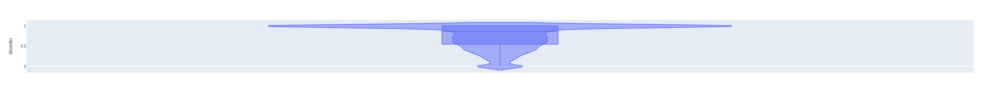

In [ ]:
prop = "plddt"
th = 70
tmp = results[(results["org"] == "ORYSJ") & (results[prop] <= th) & (results["has_bs"] == False)]
not_found = len(tmp[tmp["disorder"].isna()])
fig = px.violin(tmp, y="disorder", box=True)
fig.update_layout(width=400, height=300)

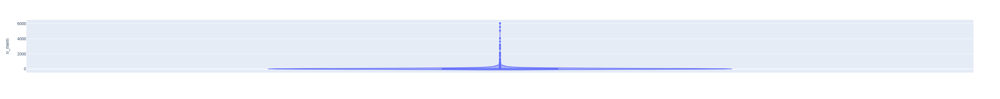

In [ ]:
fig = px.violin(tmp, y="n_mem", box=True)
fig.update_layout(width=400, height=300)

In [ ]:
num_low_plddt = len(tmp)
num_high_disorder = len(tmp[tmp["disorder"] > 0.5])
round(num_high_disorder/num_low_plddt,3)

0.783

In [ ]:
tmp = results[(results["org"] == "ORYSJ") & (results[prop] <= th) & (results["has_bs"] == False)]
num_no_go = round(len(tmp[tmp["go_terms"].isna()])/len(tmp), 2)
print(f"Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: {num_no_go}")

num_is_dark = round(len(tmp[tmp["is_dark"] == True])/len(tmp), 2)
print(f"Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: {num_is_dark}")

Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: 0.72
Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: 0.06


In [ ]:
fs_count = Counter(tmp["fs_clust"])
fs_count.most_common(10), len(fs_count), len(tmp)

([('Q5W6A1', 13),
  ('A0A0P0W9J5', 10),
  ('A0A6A4R444', 9),
  ('J3LE19', 9),
  ('Q5JK20', 9),
  ('A0A0N7KGB1', 8),
  ('A0A5N5EYC4', 8),
  ('A0A896W763', 8),
  ('A0A830BJF9', 8),
  ('B9RA60', 8)],
 20219,
 22029)

In [ ]:
for fs_clust, count in fs_count.most_common(20):
    clust_df = tmp[tmp["fs_clust"] == fs_clust]
    print(fs_clust, count, clust_df["n_mem"].to_list()[0])

Q5W6A1 13 nan
A0A0P0W9J5 10 nan
A0A6A4R444 9 768.0
J3LE19 9 398.0
Q5JK20 9 222.0
A0A0N7KGB1 8 2.0
A0A5N5EYC4 8 488.0
A0A896W763 8 293.0
A0A830BJF9 8 816.0
B9RA60 8 522.0
A0A6P5ZL06 7 421.0
A0A445ERW1 7 67.0
A0A1D1YQ13 7 456.0
A0A072VAV3 7 387.0
A0A6I9U8K5 7 458.0
B4FVN7 7 277.0
A0A4P9Q293 7 233.0
A0A200PQQ7 7 363.0
A0A0P0VMX4 7 nan
A0A0P0Y867 7 nan


In [ ]:
counter = Counter(tmp["is_dark"])
len(tmp[tmp["is_dark"].isna()]), len(tmp)

(15085, 22029)

In [ ]:
tmp = results[(results["org"] != "ORYSJ") & (results[prop] <= th) & (results["has_bs"] == False)]
num_no_go = round(len(tmp[tmp["go_terms"].isna()])/len(tmp), 2)
print(f"Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: {num_no_go}")

num_is_dark = round(len(tmp[tmp["is_dark"] == True])/len(tmp), 2)
print(f"Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: {num_is_dark}")

Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: 0.3
Percentage of proteins without binding sites and low pLDDT that are not assigned with any GO term: 0.07


In [ ]:
fs_count = Counter(tmp["fs_clust"])
fs_count.most_common(20)

[('A0A6A4R444', 81),
 (None, 75),
 ('A0A830BJF9', 55),
 ('A0A6J1VIB9', 50),
 ('A0A5N5EYC4', 48),
 ('A0A194UYJ9', 43),
 ('A0A6P5ZL06', 40),
 ('J3LE19', 39),
 ('A0A368UIC0', 38),
 ('W9SXW8', 35),
 ('A0A896W763', 35),
 ('A0A1D1YQ13', 35),
 ('A0A072VAV3', 33),
 ('B9RA60', 32),
 ('Q1PFY3', 30),
 ('A0A670HTC1', 30),
 ('A0A3B3C2G0', 30),
 ('A0A200PQQ7', 29),
 ('Q5JK20', 29),
 ('A0A835KUZ8', 28)]

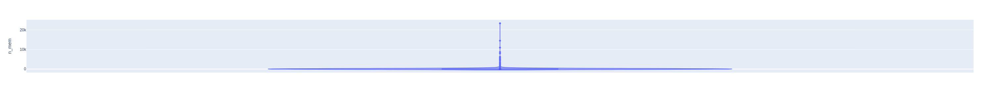

In [ ]:
fig = px.violin(tmp, y="n_mem", box=True)
fig.update_layout(width=400, height=300)

In [ ]:
test = results.groupby("org")
for org, group in test: 
    tmp = group[group["is_dark"] == 1]
    print(org, len(tmp), len(group))

ARATH 798 25218
CAEEL 980 18105
CANAL 217 5741
DROME 627 12605
ECOLI 30 3834
HUMAN 149 19494
MAIZE 1367 36282
MOUSE 147 20571
ORYSJ 1340 31293
SOYBN 1809 48668
YEAST 158 5681


In [ ]:
ORG_DICT

{'ECOLI': {'#pockets': 1678, '#FS_clust': 3021},
 'YEAST': {'#pockets': 2325, '#FS_clust': 4775},
 'CANAL': {'#pockets': 2334, '#FS_clust': 5026},
 'ARATH': {'#pockets': 8714, '#FS_clust': 14507},
 'MAIZE': {'#pockets': 10493, '#FS_clust': 21417},
 'ORYSJ': {'#pockets': 9022, '#FS_clust': 21669},
 'SOYBN': {'#pockets': 16711, '#FS_clust': 20801},
 'DROME': {'#pockets': 4372, '#FS_clust': 9794},
 'CAEEL': {'#pockets': 6259, '#FS_clust': 11955},
 'MOUSE': {'#pockets': 7702, '#FS_clust': 13137},
 'HUMAN': {'#pockets': 6905, '#FS_clust': 13546}}

# FoldSeek cluster vs communities

In [12]:
out_dir = "../../results/pictures/REVISION"
org_colors = {"ECOLI": "#0000FF", "CAEEL": "#40E0D0","YEAST": "gray", "CANAL": "#d62728", "DROME": "#9467bd",
             "MOUSE": "#f0e442", "HUMAN": "#FF9900", "ARATH": "#990099", "ORYSJ": "green",
             "SOYBN": "brown", "MAIZE": "black"}

In [53]:

cluster_df = pd.read_csv(f"{out_dir}/communities_random.csv")
# cluster_df = cluster_df[cluster_df["#Communities"] >= pocket_th]
cluster_df["N_FS_cluster"] = [ORG_DICT.get(org)["#FS_clust"] for org in cluster_df["Organism"]]
cluster_df["N_Unique_BS"] = cluster_df["#Communities"] + cluster_df["#Singletons"]
cluster_df["N_pockets_N_FS"] = cluster_df["N_Unique_BS"] / cluster_df["N_FS_cluster"]
cluster_df["N_Singletons_N_FS"] = cluster_df["#Singletons"] / cluster_df["N_FS_cluster"]
cluster_df["N_real_N_FS"] = cluster_df["#Communities"]/cluster_df["N_FS_cluster"] 
cluster_df["log(N_FS_cluster)"] = np.log(cluster_df["N_FS_cluster"].to_numpy())
cluster_df["log(N_uniqe_bs)"] = np.log(cluster_df["N_Unique_BS"].to_numpy())
cluster_df["log(N_communities)"] = np.log(cluster_df["#Communities"].to_numpy())
cluster_df.index = cluster_df["Organism"]
cluster_df

,Organism,Pocket_th,#Pockets,#Communities,#Singletons,Single_frac,Largest_comm,N_FS_cluster,N_Unique_BS,N_pockets_N_FS,N_Singletons_N_FS,N_real_N_FS,log(N_FS_cluster),log(N_uniqe_bs),log(N_communities)
Organism,,,,,,,,,,,,,,,
ECOLI,ECOLI,0.5,2648,30,15,0.006,149,3010,45,0.014950,0.004983,0.009967,8.009695,3.806662,3.401197
YEAST,YEAST,0.5,3000,26,2,0.001,171,4730,28,0.005920,0.000423,0.005497,8.461680,3.332205,3.258097
CANAL,CANAL,0.5,3124,26,6,0.002,220,4930,32,0.006491,0.001217,0.005274,8.503094,3.465736,3.258097
ARATH,ARATH,0.5,11075,9,0,0.000,1744,14325,9,0.000628,0.000000,0.000628,9.569762,2.197225,2.197225
ORYSJ,ORYSJ,0.5,10618,8,0,0.000,2059,21379,8,0.000374,0.000000,0.000374,9.970164,2.079442,2.079442
MAIZE,MAIZE,0.5,13177,10,0,0.000,2048,20896,10,0.000479,0.000000,0.000479,9.947313,2.302585,2.302585
SOYBN,SOYBN,0.5,20915,8,0,0.000,3614,20476,8,0.000391,0.000000,0.000391,9.927009,2.079442,2.079442
DROME,DROME,0.5,5867,20,0,0.000,501,9652,20,0.002072,0.000000,0.002072,9.174920,2.995732,2.995732
CAEEL,CAEEL,0.5,8850,17,0,0.000,1703,11794,17,0.001441,0.000000,0.001441,9.375346,2.833213,2.833213


In [45]:
cluster_df = cluster_df[cluster_df["Pocket_th"] == 0.5]

In [46]:
cluster_df.index = cluster_df["Organism"]
max_org  = cluster_df["N_real_N_FS"].idxmax()
max_num = cluster_df["N_real_N_FS"].max()
print(f"Organism with maximum #Communities/#FS: {max_org} with {max_num}")
min_org = cluster_df["N_real_N_FS"].idxmin()
min_num = cluster_df["N_real_N_FS"].min()
print(f"Organism with minimum #Communities/#FS: {min_org} with {min_num}")
min_max = max_num/ min_num
print(f"Min-max ratio for #Communities/#FS: {round(min_max, 3)}")
min_max = cluster_df.at["ECOLI", "N_FS_cluster"] / cluster_df.at["ORYSJ", "N_FS_cluster"]
ecoli_num = cluster_df.at["ECOLI", "N_FS_cluster"]
orysj_num = cluster_df.at["ORYSJ", "N_FS_cluster"]
print(f"Min-max ratio for #FS clusters: {round(min_max, 3)} for ECOLI ({ecoli_num}) and ORYSJ ({orysj_num})")

Organism with maximum #Communities/#FS: ECOLI with 0.08704318936877077
Organism with minimum #Communities/#FS: ORYSJ with 0.030169792787314655
Min-max ratio for #Communities/#FS: 2.885
Min-max ratio for #FS clusters: 0.141 for ECOLI (3010) and ORYSJ (21379)


Log-log linear model for #FS cluster and # unique BS: y = -0.884 * x + 10.901, Pearson r: -0.957 with p-value 0.0.
Log-log linear model: y = -0.719 * x + 9.313, Pearson r: -0.929 with p-value 0.0.


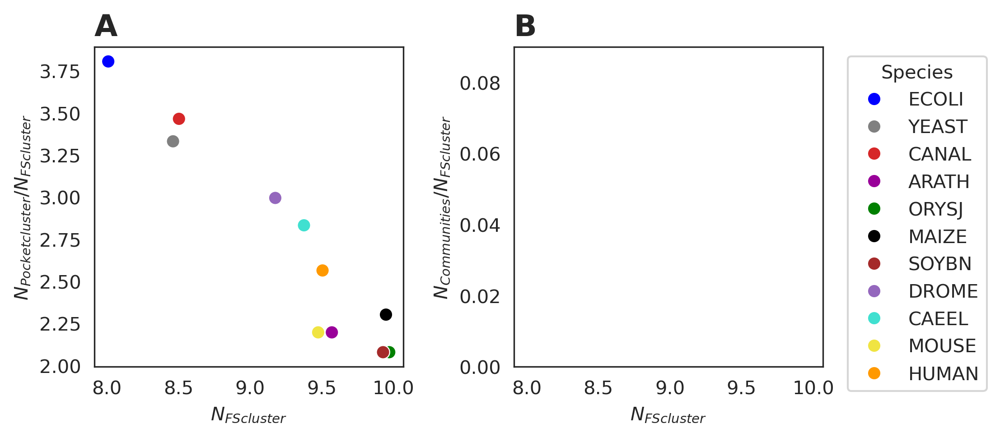

In [56]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns

# Scatter plot
organisms = ["ECOLI", "YEAST", "CANAL", "ARATH", "ORYSJ", "MAIZE", "SOYBN", "DROME","CAEEL", "MOUSE", "HUMAN"]
fig_width = 2250 
fig_height = 1000
dpi=300
figsize_in = (fig_width/dpi, fig_height/dpi)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize= figsize_in, dpi=dpi)
sns.set_style("white")
sns.scatterplot(data=cluster_df, x="log(N_FS_cluster)", y="log(N_uniqe_bs)", hue="Organism", 
                palette=org_colors, ax=ax1, s=50, legend=False)
sns.scatterplot(data=cluster_df, x="log(N_FS_cluster)", y="log(N_communities)", hue="Organism",
                palette=org_colors, ax=ax2, s=50, legend = True)

# Customizing plots
ax1.set_facecolor("white")
ax1.set_xlabel("$N_{FS cluster}$", fontsize=10)
ax1.set_ylabel("$N_{Pocket cluster}$/$N_{FS cluster}$", fontsize=10)
##ax1.set_ylim(0, 0.5)
ax1.set_title("A", loc='left', fontsize=16, fontweight='bold')
ax1.tick_params(axis='both', which='major', labelsize=10)

ax2.set_facecolor("white")
ax2.set_xlabel("$N_{FS cluster}$", fontsize=10)
ax2.set_ylabel("$N_{Communities}$/$N_{FS cluster}$", fontsize=10)
ax2.set_title("B", loc='left', fontsize=16, fontweight='bold')
ax2.set_ylim(0, 0.09)
ax2.tick_params(axis='both', which='major', labelsize=10)
ax2.legend(fontsize=10, title="Species", bbox_to_anchor=(1.05, 1.0), loc='upper left')

# Saving and showing the plot
plt.tight_layout()
# plt.savefig(f"{out_dir}/cluster_fs_pocket_probis_comm.tif", dpi=300)


# Line of best fit (slope)
a, b = np.polyfit(cluster_df["log(N_FS_cluster)"], cluster_df["log(N_uniqe_bs)"], 1)
pearson_r, p_val = pearsonr(cluster_df["log(N_FS_cluster)"], cluster_df["log(N_uniqe_bs)"])
print(f"Log-log linear model for #FS cluster and # unique BS: y = {round(a, 3)} * x + {round(b, 3)}, Pearson r: {round(pearson_r, 3)} with p-value {round(p_val, 3)}.")

# Line of best fit (slope)
a, b = np.polyfit(cluster_df["log(N_FS_cluster)"], cluster_df["log(N_communities)"], 1)
pearson_r, p_val = pearsonr(cluster_df["log(N_FS_cluster)"], cluster_df["log(N_communities)"])
print(f"Log-log linear model: y = {round(a, 3)} * x + {round(b, 3)}, Pearson r: {round(pearson_r, 3)} with p-value {round(p_val, 3)}.")

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr
import seaborn as sns

# Scatter plot
for th in [0.5, 0.6, 0.7, 0.8, 0.9]:
    tmp = cluster_df.copy()
    tmp = tmp[tmp["Pocket_th"] == th]
    # tmp["New_n_pockets"] = tmp["N_pockets_N_FS"] / tmp.at["ECOLI", "N_pockets_N_FS"]
    # tmp["New_n_real"] = tmp["N_real_N_FS"] / tmp.at["ECOLI", "N_real_N_FS"]
    print(f"Pocket theshold: {th}")

    fig_width = 2250 
    fig_height = 1000
    dpi=300
    figsize_in = (fig_width/dpi, fig_height/dpi)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize= figsize_in, dpi=dpi)
    sns.set_style("white")
    sns.scatterplot(data=tmp, x="log(N_FS_cluster)", y="log(N_uniqe_bs)", hue="Organism", 
                    palette=org_colors, ax=ax1, s=50, legend=False)
    sns.scatterplot(data=tmp, x="log(N_FS_cluster)", y="log(N_communities)", hue="Organism",
                    palette=org_colors, ax=ax2, s=50, legend = True)

    # Customizing plots
    ax1.set_facecolor("white")
    ax1.set_xlabel("$N_{FS cluster}$", fontsize=10)
    ax1.set_ylabel("$N_{Pocket cluster}$/$N_{FS cluster}$", fontsize=10)
    # ax1.set_ylim(0, 0.5)
    ax1.set_title("A", loc='left', fontsize=16, fontweight='bold')
    ax1.tick_params(axis='both', which='major', labelsize=10)

    ax2.set_facecolor("white")
    ax2.set_xlabel("$N_{FS cluster}$", fontsize=10)
    ax2.set_ylabel("$N_{Communities}$/$N_{FS cluster}$", fontsize=10)
    ax2.set_title("B", loc='left', fontsize=16, fontweight='bold')
    # ax2.set_ylim(0, 0.09)
    ax2.tick_params(axis='both', which='major', labelsize=10)
    ax2.legend(fontsize=10, title="Species", bbox_to_anchor=(1.05, 1.0), loc='upper left')

    # Saving and showing the plot
    plt.tight_layout()
    plt.savefig(f"{out_dir}/cluster_fs_pocket_probis_comm_{th}.tif", dpi=300)
    plt.close()

    # Line of best fit (slope)
    a, b = np.polyfit(tmp["log(N_FS_cluster)"], tmp["log(N_uniqe_bs)"], 1)
    pearson_r, p_val = pearsonr(tmp["log(N_FS_cluster)"], tmp["log(N_uniqe_bs)"])
    print(f"Log-log linear model for #FS cluster and # unique BS: y = {round(a, 3)} * x + {round(b, 3)}, Pearson r: {round(pearson_r, 3)} with p-value {round(p_val, 3)}.")

    # Line of best fit (slope)
    a, b = np.polyfit(tmp["log(N_FS_cluster)"], tmp["log(N_communities)"], 1)
    pearson_r, p_val = pearsonr(tmp["log(N_FS_cluster)"], tmp["log(N_communities)"])
    print(f"Log-log linear model for #FS cluster and # real communities: y = {round(a, 3)} * x + {round(b, 3)}, Pearson r: {round(pearson_r, 3)} with p-value {round(p_val, 3)}.")

Pocket theshold: 0.5
Log-log linear model for #FS cluster and # unique BS: y = 0.341 * x + 4.481, Pearson r: 0.934 with p-value 0.0.
Log-log linear model for #FS cluster and # real communities: y = 0.624 * x + 0.479, Pearson r: 0.948 with p-value 0.0.
Pocket theshold: 0.6
Log-log linear model for #FS cluster and # unique BS: y = 0.271 * x + 4.853, Pearson r: 0.912 with p-value 0.0.
Log-log linear model for #FS cluster and # real communities: y = 0.568 * x + 0.804, Pearson r: 0.944 with p-value 0.0.
Pocket theshold: 0.7
Log-log linear model for #FS cluster and # unique BS: y = 0.21 * x + 5.139, Pearson r: 0.829 with p-value 0.002.
Log-log linear model for #FS cluster and # real communities: y = 0.535 * x + 0.926, Pearson r: 0.944 with p-value 0.0.
Pocket theshold: 0.8
Log-log linear model for #FS cluster and # unique BS: y = 0.147 * x + 5.414, Pearson r: 0.702 with p-value 0.016.
Log-log linear model for #FS cluster and # real communities: y = 0.519 * x + 0.844, Pearson r: 0.941 with p-

/tmp/ipykernel_13928/3919337324.py:1: DtypeWarning: Columns (19) have mixed types. Specify dtype option on import or set low_memory=False.
  pocket_df = pd.read_csv(f"{out_dir}/pocket_df.csv")


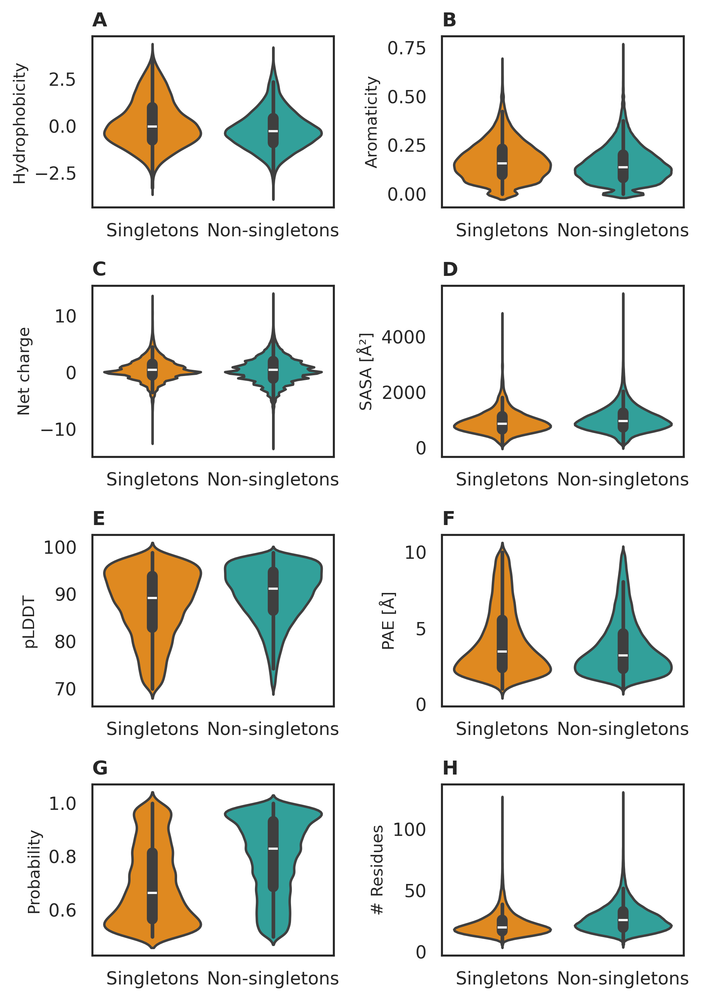

In [64]:
pocket_df = pd.read_csv(f"{out_dir}/pocket_df.csv")
dpi = 300
fig_width_px = 1850
fig_height_px = 2625
figsize_in = (fig_width_px / dpi, fig_height_px / dpi)
sns.set(style='white', font_scale=1)
n_rows = 4
n_cols = 2
row = 0
col = 0
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=figsize_in, dpi=dpi)

prop_dict = {"hydro": "Hydrophobicity", "aro": "Aromaticity", "net_charge": "Net charge",
            "sasa": "SASA [\u212B\u00b2]","plddt": "pLDDT", "pae": "PAE [\u212B]",
            "prob": "Probability", "num_res": "# Residues",
            }
titles = ["A", "B", "C", "D", "E", "F", "G", "H"]

for idx, (prop, label) in enumerate(prop_dict.items()):
    ax = axes[row, col]
    sns.violinplot(x='probis_single', y=prop,
                   data=pocket_df, 
                   hue='probis_single',
                   palette={'Non-singletons': 'lightseagreen', 'Singletons': 'darkorange'},
                   inner='box', linewidth=1.5, ax=ax)

    # Customize plot appearance
    ax.set_title(titles[idx], fontsize=12, weight='bold', loc='left')
    ax.set_ylabel(label, fontsize=10)
    ax.set_xlabel('')
    ax.tick_params("x", rotation=0)
    
    # Perform t-test 
    # t_stat, p_val = ttest_ind(list(probis_all[prop]), list(singles_all[prop]))
    # cohen_d, std_single, std_non_single = get_cohen_d(singles_all[prop], probis_all[prop])
    # ttest_results.append([prop, t_stat, p_val, probis_all[prop].median(), singles_all[prop].median(), round(std_single,3), round(std_non_single,3), round(cohen_d,3)])

    col += 1
    if col == n_cols:
        col = 0
        row += 1

plt.tight_layout()
plt.savefig(f"{out_dir}/single_vs_non_single.tif",dpi=dpi, format="tif")

# Community analysis

In [ ]:
comm_map = {}
comm_len_map = {}
comm_dict = pkl.load(open("../../../probis_clustering/results/all_communities.pkl", "rb"))
comm_len_dict = []
for org, comms in comm_dict.items(): 
    for idx, comm in enumerate(comms):
        comm_len_dict.append({"org": org, "id": f"{org}_{idx}", "#mem": len(comm), "mem": comm})
        for pocket in comm: 
            prot = pocket.split("_")[0][3:]
            if prot in comm_map: 
                comm_map[prot].append(f"{org}_{idx}")
                comm_len_map[prot].append(len(comm))
            else:
                comm_map[prot] = [f"{org}_{idx}"]
                comm_len_map[prot] = [len(comm)]
    
results["community"] = results["index"].map(comm_map)
results["comm_len"] = results["index"].map(comm_len_map)
results["#comms"] = [len(comm) if type(comm) != float else 0 for comm in results["community"]]

In [ ]:
tmp = results[(results["has_bs"]) & (results["#comms"] > 1)]
tmp

,index,org,has_bs,disorder,#aa,plddt,go_terms,fs_clust,clu_flag,n_mem,is_dark,not_in_mobi,is_plant,no_go,frag,community,comm_len,#comms
29215,Q9SHP6,ARATH,True,0.086,383,91.10,"[GO:0016788, GO:0016042, GO:0005576, GO:001678...",A0A6P5U0L8,1,1055.0,0.0,False,True,False,NaN,"[ARATH_11, ARATH_11]","[149, 149]",2
29092,Q9ZNQ5,ARATH,True,0.150,387,87.42,"[GO:0016020, GO:0000325, GO:0005739, GO:000578...",W1P9K1,1,51.0,0.0,False,True,False,NaN,"[ARATH_81, ARATH_81]","[16, 16]",2
29156,O65434,ARATH,True,0.099,604,87.73,"[GO:0016102, GO:0000287, GO:0010333, GO:004687...",A0A5N5HYQ5,1,74.0,0.0,False,True,False,NaN,"[ARATH_20, ARATH_209]","[80, 5]",2
29120,Q501F6,ARATH,True,0.039,333,95.00,"[GO:0003674, GO:0008150]",A0A7S3SX73,2,604.0,0.0,False,True,False,NaN,"[ARATH_7, ARATH_7]","[255, 255]",2
29357,Q8LFP7,ARATH,True,0.224,294,83.34,"[GO:0016020, GO:0015267, GO:0055085, GO:001602...",A0A4P5V5Y5,1,237.0,0.0,False,True,False,NaN,"[ARATH_75, ARATH_75]","[17, 17]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8481,P40160,YEAST,True,0.167,425,72.61,"[GO:0004672, GO:0005634, GO:0005634, GO:000573...",A0A183VCZ2,1,70.0,0.0,False,False,False,NaN,"[YEAST_1, YEAST_1]","[128, 128]",2
8362,Q12069,YEAST,True,0.102,462,86.25,"[GO:0009982, GO:0031119, GO:0005739, GO:000563...",A3LWS8,1,70.0,0.0,False,False,False,NaN,"[YEAST_38, YEAST_38]","[7, 7]",2
8373,P40495,YEAST,True,0.038,371,92.21,"[GO:0047046, GO:0009085, GO:0005739, GO:000573...",V5G5L5,1,91.0,0.0,False,False,False,NaN,"[YEAST_131, YEAST_132]","[3, 3]",2
8398,Q07950,YEAST,True,0.095,538,83.57,"[GO:0004771, GO:0004771, GO:0005886, GO:001602...",A0A5Q7YI35,1,172.0,0.0,False,False,False,NaN,"[YEAST_10, YEAST_308]","[25, 2]",2


In [ ]:
comm_df = pd.DataFrame(comm_len_dict)
comm_df.head()

,org,id,#mem,mem
0,ECOLI,ECOLI_0,110,"[AF-P60782_0, AF-P24203_0, AF-P16676_0, AF-P09..."
1,ECOLI,ECOLI_1,65,"[AF-P0AFQ7_0, AF-P39408_0, AF-P16692_0, AF-P27..."
2,ECOLI,ECOLI_2,51,"[AF-P36929_0, AF-P06992_0, AF-P76373_0, AF-P27..."
3,ECOLI,ECOLI_3,47,"[AF-P0AF67_0, AF-Q46844_0, AF-P0AGD7_0, AF-P76..."
4,ECOLI,ECOLI_4,45,"[AF-P75728_0, AF-Q46904_0, AF-P25535_0, AF-P77..."


In [ ]:
big = 10
comm_df["is_big"] = comm_df["#mem"] > big
for org in ORGANISMS:
    if org == "SOYBN":
        continue
    num_com = len(comm_df[comm_df["org"] == org])
    num_big = len(comm_df[(comm_df["org"] == org) & (comm_df["#mem"] >= big)])
    print(f"Fraction of cluster with more than {big} member for {org}: {round(num_big/num_com, 2)}, # big clusters: {num_big}")

Fraction of cluster with more than 10 member for ECOLI: 0.11, # big clusters: 30
Fraction of cluster with more than 10 member for YEAST: 0.07, # big clusters: 24
Fraction of cluster with more than 10 member for CANAL: 0.13, # big clusters: 38
Fraction of cluster with more than 10 member for ARATH: 0.19, # big clusters: 130
Fraction of cluster with more than 10 member for MAIZE: 0.16, # big clusters: 128
Fraction of cluster with more than 10 member for ORYSJ: 0.18, # big clusters: 115
Fraction of cluster with more than 10 member for DROME: 0.15, # big clusters: 72
Fraction of cluster with more than 10 member for CAEEL: 0.18, # big clusters: 88
Fraction of cluster with more than 10 member for MOUSE: 0.13, # big clusters: 77
Fraction of cluster with more than 10 member for HUMAN: 0.13, # big clusters: 80


In [ ]:
go_term_dict = dict(zip(results["index"], results["go_terms"]))

In [ ]:
big_go = 0
big_no_go = 0
other_go = 0
other_no_go = 0
for comm, all_mem, is_big in zip(comm_df["id"], comm_df["mem"], comm_df["is_big"]): 
    for mem in all_mem: 
        prot = mem.split("_")[0][3:]
        go_terms = go_term_dict.get(prot)
        if is_big and go_terms: 
            big_go += 1
        elif is_big and not go_terms: 
            big_no_go += 1
        elif not is_big and go_terms: 
            other_go += 1
        elif not is_big and not go_terms: 
            other_no_go += 1 
        else:
            print(mem) 

conf_matrix = [[big_go, big_no_go], [other_go, other_no_go]]
res = fisher_exact(conf_matrix)
print("Enrichment for proteins with GO terms in big clusters (>= 10 members)")
print(f"p-value: {round(res.pvalue, 3)}, odd ratio: {round(res.statistic, 3)}")

Enrichment for proteins with GO terms in big clusters (>= 10 members)
p-value: 0.0, odd ratio: 1.679


In [ ]:
tmp = comm_df[comm_df["is_big"]]
big_go = []
all_go = []
num_missing = 0
num_mem = 0
for comm, all_mem, is_big in zip(tmp["id"], tmp["mem"], comm_df["is_big"]): 
    for mem in all_mem:
        num_mem += 1
        prot = mem.split("_")[0][3:]
        go_terms = go_term_dict.get(prot)
        if go_terms and is_big: 
            all_go += list(set(go_terms))
            big_go += list(set(go_terms))
        elif go_terms and not is_big: 
            all_go += list(set(go_terms))
        else:
            num_missing += 1

print(f"Ratio of members with missing GO terms: {round(num_missing/num_mem, 3)}")
print(f"Number of GO terms found in the big communities: {len(set(all_go))}")

Ratio of members with missing GO terms: 0.036
Number of GO terms found in the big communities: 16803


In [ ]:
single_go = 0
single_no_go = 0
other_go = 0
other_no_go = 0

tmp = results[results["has_bs"]]
for prot, go_terms, comm in zip(tmp["index"], tmp["go_terms"], tmp["community"]): 
    
    if type(comm) == list and go_terms: 
        other_go += 1
    elif type(comm) == list and not go_terms: 
        other_no_go += 1
    elif math.isnan(comm) and go_terms: 
        single_go += 1
    elif math.isnan(comm) and not go_terms: 
        single_no_go += 1 
    else:
        print(prot) 

conf_matrix = [[single_go, single_no_go], [other_go, other_no_go]]
res = fisher_exact(conf_matrix)
print("Enrichment for proteins with GO terms singletons")
print(f"p-value: {round(res.pvalue, 3)}, odd ratio: {round(res.statistic, 3)}")

Enrichment for proteins with GO terms singletons
p-value: 0.0, odd ratio: 0.515


# GO enrichment

In [ ]:
# Load GO DAG (Ontology)
go_dag = GODag(f"{GOA_PATH}/go-basic.obo")

# Prepare data: split by species
species_groups = results.groupby('org')

# Dictionary to store results
enrichment_results = defaultdict(dict)

# Iterate over species
for species, group in species_groups:
    print(species)
    # Get background (all proteins for this species)
    background_proteins = set(group['index'])
    
    # Define subsets (e.g., proteins with binding sites)
    tmp = comm_df[(comm_df["is_big"]) & (comm_df["org"] == species)]
    for idx, comms in zip(tmp["id"],tmp["mem"]):
        proteins_big = [p.split("_")[0][3:] for p in comms]
    
        # Parse GO terms into mapping
        go_annotations = group.set_index("index")["go_terms"].to_dict()
        go_annotations = {prot: set(go) if go else set() for prot, go in go_annotations.items()}
        # Perform enrichment
        study = GOEnrichmentStudy(
            background_proteins,  # Background set
            go_annotations,       # GO term annotations
            go_dag                # GO DAG
        )
        go_results = study.run_study(proteins_big)
    
        # Store results for this species
        enrichment_results[idx] = go_results

../../../Pocketeome/db_files/GOA/go-basic.obo: fmt(1.2) rel(2024-10-27) 44,017 Terms
ARATH

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 897 IDs.
100%    888 of    888 study items found in association
 99%    888 of    897 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
   1,621 terms are associated with    887 of    888 study items
  METHOD bonferroni:
     334 GO terms found significant (< 0.05=alpha) (225 enriched + 109 purified): local bonferroni
     887 study items associated with significant GO IDs (enriched)
     369 study items associated with significant GO IDs (purified)
  METHOD sidak:
     334 GO terms found significant (< 0.05=alpha) (225 enriched + 109 purified): local sidak
     887 study items associated with significant GO IDs (enriched)
     369 study items associated with significant GO IDs (purified)
  METHOD holm:
     336 GO terms found significant (< 0.05=alpha) (227 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 459 IDs.
100%    450 of    450 study items found in association
 98%    450 of    459 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
   1,476 terms are associated with    449 of    450 study items
  METHOD bonferroni:
     200 GO terms found significant (< 0.05=alpha) (183 enriched +  17 purified): local bonferroni
     449 study items associated with significant GO IDs (enriched)
      34 study items associated with significant GO IDs (purified)
  METHOD sidak:
     214 GO terms found significant (< 0.05=alpha) (197 enriched +  17 purified): local sidak
     449 study items associated with significant GO IDs (enriched)
      34 study items associated with significant GO IDs (purified)
  METHOD holm:
     214 GO terms found significant (< 0.05=alpha) (197 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 426 IDs.
100%    396 of    396 study items found in association
 93%    396 of    426 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
   1,168 terms are associated with    393 of    396 study items
  METHOD bonferroni:
     219 GO terms found significant (< 0.05=alpha) (174 enriched +  45 purified): local bonferroni
     386 study items associated with significant GO IDs (enriched)
     146 study items associated with significant GO IDs (purified)
  METHOD sidak:
     219 GO terms found significant (< 0.05=alpha) (174 enriched +  45 purified): local sidak
     386 study items associated with significant GO IDs (enriched)
     146 study items associated with significant GO IDs (purified)
  METHOD holm:
     219 GO terms found significant (< 0.05=alpha) (174 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 324 IDs.
100%    294 of    294 study items found in association
 91%    294 of    324 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
   1,041 terms are associated with    278 of    294 study items
  METHOD bonferroni:
     175 GO terms found significant (< 0.05=alpha) (140 enriched +  35 purified): local bonferroni
     259 study items associated with significant GO IDs (enriched)
     116 study items associated with significant GO IDs (purified)
  METHOD sidak:
     175 GO terms found significant (< 0.05=alpha) (140 enriched +  35 purified): local sidak
     259 study items associated with significant GO IDs (enriched)
     116 study items associated with significant GO IDs (purified)
  METHOD holm:
     175 GO terms found significant (< 0.05=alpha) (140 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 312 IDs.
100%    232 of    232 study items found in association
 74%    232 of    312 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     561 terms are associated with    232 of    232 study items
  METHOD bonferroni:
     113 GO terms found significant (< 0.05=alpha) ( 60 enriched +  53 purified): local bonferroni
     232 study items associated with significant GO IDs (enriched)
     135 study items associated with significant GO IDs (purified)
  METHOD sidak:
     113 GO terms found significant (< 0.05=alpha) ( 60 enriched +  53 purified): local sidak
     232 study items associated with significant GO IDs (enriched)
     135 study items associated with significant GO IDs (purified)
  METHOD holm:
     113 GO terms found significant (< 0.05=alpha) ( 60 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 302 IDs.
100%    291 of    291 study items found in association
 96%    291 of    302 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
   1,224 terms are associated with    280 of    291 study items
  METHOD bonferroni:
     125 GO terms found significant (< 0.05=alpha) (105 enriched +  20 purified): local bonferroni
     264 study items associated with significant GO IDs (enriched)
      45 study items associated with significant GO IDs (purified)
  METHOD sidak:
     126 GO terms found significant (< 0.05=alpha) (106 enriched +  20 purified): local sidak
     264 study items associated with significant GO IDs (enriched)
      45 study items associated with significant GO IDs (purified)
  METHOD holm:
     125 GO terms found significant (< 0.05=alpha) (105 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 268 IDs.
100%    247 of    247 study items found in association
 92%    247 of    268 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     915 terms are associated with    247 of    247 study items
  METHOD bonferroni:
     128 GO terms found significant (< 0.05=alpha) (110 enriched +  18 purified): local bonferroni
     247 study items associated with significant GO IDs (enriched)
      33 study items associated with significant GO IDs (purified)
  METHOD sidak:
     128 GO terms found significant (< 0.05=alpha) (110 enriched +  18 purified): local sidak
     247 study items associated with significant GO IDs (enriched)
      33 study items associated with significant GO IDs (purified)
  METHOD holm:
     128 GO terms found significant (< 0.05=alpha) (110 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 255 IDs.
100%    244 of    244 study items found in association
 96%    244 of    255 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     519 terms are associated with    229 of    244 study items
  METHOD bonferroni:
      85 GO terms found significant (< 0.05=alpha) ( 33 enriched +  52 purified): local bonferroni
     180 study items associated with significant GO IDs (enriched)
      90 study items associated with significant GO IDs (purified)
  METHOD sidak:
      85 GO terms found significant (< 0.05=alpha) ( 33 enriched +  52 purified): local sidak
     180 study items associated with significant GO IDs (enriched)
      90 study items associated with significant GO IDs (purified)
  METHOD holm:
      85 GO terms found significant (< 0.05=alpha) ( 33 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 218 IDs.
100%    207 of    207 study items found in association
 95%    207 of    218 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     542 terms are associated with    203 of    207 study items
  METHOD bonferroni:
     164 GO terms found significant (< 0.05=alpha) (124 enriched +  40 purified): local bonferroni
     203 study items associated with significant GO IDs (enriched)
      68 study items associated with significant GO IDs (purified)
  METHOD sidak:
     164 GO terms found significant (< 0.05=alpha) (124 enriched +  40 purified): local sidak
     203 study items associated with significant GO IDs (enriched)
      68 study items associated with significant GO IDs (purified)
  METHOD holm:
     164 GO terms found significant (< 0.05=alpha) (124 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 218 IDs.
100%    212 of    212 study items found in association
 97%    212 of    218 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     829 terms are associated with    209 of    212 study items
  METHOD bonferroni:
     138 GO terms found significant (< 0.05=alpha) (116 enriched +  22 purified): local bonferroni
     206 study items associated with significant GO IDs (enriched)
     125 study items associated with significant GO IDs (purified)
  METHOD sidak:
     138 GO terms found significant (< 0.05=alpha) (116 enriched +  22 purified): local sidak
     206 study items associated with significant GO IDs (enriched)
     125 study items associated with significant GO IDs (purified)
  METHOD holm:
     138 GO terms found significant (< 0.05=alpha) (116 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 204 IDs.
100%    184 of    184 study items found in association
 90%    184 of    204 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     949 terms are associated with    182 of    184 study items
  METHOD bonferroni:
     159 GO terms found significant (< 0.05=alpha) (143 enriched +  16 purified): local bonferroni
     181 study items associated with significant GO IDs (enriched)
      26 study items associated with significant GO IDs (purified)
  METHOD sidak:
     159 GO terms found significant (< 0.05=alpha) (143 enriched +  16 purified): local sidak
     181 study items associated with significant GO IDs (enriched)
      26 study items associated with significant GO IDs (purified)
  METHOD holm:
     159 GO terms found significant (< 0.05=alpha) (143 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 149 IDs.
100%    134 of    134 study items found in association
 90%    134 of    149 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     272 terms are associated with    134 of    134 study items
  METHOD bonferroni:
      54 GO terms found significant (< 0.05=alpha) ( 20 enriched +  34 purified): local bonferroni
     134 study items associated with significant GO IDs (enriched)
      25 study items associated with significant GO IDs (purified)
  METHOD sidak:
      54 GO terms found significant (< 0.05=alpha) ( 20 enriched +  34 purified): local sidak
     134 study items associated with significant GO IDs (enriched)
      25 study items associated with significant GO IDs (purified)
  METHOD holm:
      54 GO terms found significant (< 0.05=alpha) ( 20 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   8,923 terms are associated with 23,670 of 25,252 population items
     919 terms are associated with    136 of    143 study items
  METHOD bonferroni:
      51 GO terms found significant (< 0.05=alpha) ( 47 enriched +   4 purified): local bonferroni
     125 study items associated with significant GO IDs (enriched)
      28 study items associated with significant GO IDs (purified)
  METHOD sidak:
      51 GO terms found significant (< 0.05=alpha) ( 47 enriched +   4 purified): local sidak
     125 study items associated with significant GO IDs (enriched)
      28 study items associated with significant GO IDs (purified)
  METHOD holm:
      51 GO terms found significant (< 0.05=alpha) ( 47 enriched +   4 purified): local holm
     125 study items associated with significant GO IDs (enriched)
      28 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 142 IDs.
100%     87 of     87 study items found in association
 61%     87 of    142 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     423 terms are associated with     86 of     87 study items
  METHOD bonferroni:
      50 GO terms found significant (< 0.05=alpha) ( 48 enriched +   2 purified): local bonferroni
      84 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD sidak:
      50 GO terms found significant (< 0.05=alpha) ( 48 enriched +   2 purified): local sidak
      84 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD holm:
      50 GO terms found significant (< 0.05=alpha) ( 48 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 129 IDs.
100%    116 of    116 study items found in association
 90%    116 of    129 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     383 terms are associated with    116 of    116 study items
  METHOD bonferroni:
      98 GO terms found significant (< 0.05=alpha) ( 78 enriched +  20 purified): local bonferroni
     116 study items associated with significant GO IDs (enriched)
      20 study items associated with significant GO IDs (purified)
  METHOD sidak:
      99 GO terms found significant (< 0.05=alpha) ( 79 enriched +  20 purified): local sidak
     116 study items associated with significant GO IDs (enriched)
      20 study items associated with significant GO IDs (purified)
  METHOD holm:
      98 GO terms found significant (< 0.05=alpha) ( 78 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 127 IDs.
100%    123 of    123 study items found in association
 97%    123 of    127 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     453 terms are associated with    123 of    123 study items
  METHOD bonferroni:
      62 GO terms found significant (< 0.05=alpha) ( 40 enriched +  22 purified): local bonferroni
     123 study items associated with significant GO IDs (enriched)
      80 study items associated with significant GO IDs (purified)
  METHOD sidak:
      62 GO terms found significant (< 0.05=alpha) ( 40 enriched +  22 purified): local sidak
     123 study items associated with significant GO IDs (enriched)
      80 study items associated with significant GO IDs (purified)
  METHOD holm:
      62 GO terms found significant (< 0.05=alpha) ( 40 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 124 IDs.
100%    113 of    113 study items found in association
 91%    113 of    124 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     347 terms are associated with    113 of    113 study items
  METHOD bonferroni:
      62 GO terms found significant (< 0.05=alpha) ( 41 enriched +  21 purified): local bonferroni
     113 study items associated with significant GO IDs (enriched)
      14 study items associated with significant GO IDs (purified)
  METHOD sidak:
      62 GO terms found significant (< 0.05=alpha) ( 41 enriched +  21 purified): local sidak
     113 study items associated with significant GO IDs (enriched)
      14 study items associated with significant GO IDs (purified)
  METHOD holm:
      62 GO terms found significant (< 0.05=alpha) ( 41 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 101 IDs.
100%     98 of     98 study items found in association
 97%     98 of    101 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     355 terms are associated with     98 of     98 study items
  METHOD bonferroni:
      81 GO terms found significant (< 0.05=alpha) ( 80 enriched +   1 purified): local bonferroni
      98 study items associated with significant GO IDs (enriched)
       8 study items associated with significant GO IDs (purified)
  METHOD sidak:
      81 GO terms found significant (< 0.05=alpha) ( 80 enriched +   1 purified): local sidak
      98 study items associated with significant GO IDs (enriched)
       8 study items associated with significant GO IDs (purified)
  METHOD holm:
      81 GO terms found significant (< 0.05=alpha) ( 80 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 84 IDs.
100%     81 of     81 study items found in association
 96%     81 of     84 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     620 terms are associated with     81 of     81 study items
  METHOD bonferroni:
     128 GO terms found significant (< 0.05=alpha) (128 enriched +   0 purified): local bonferroni
      81 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
     128 GO terms found significant (< 0.05=alpha) (128 enriched +   0 purified): local sidak
      81 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
     128 GO terms found significant (< 0.05=alpha) (128 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 83 IDs.
100%     83 of     83 study items found in association
100%     83 of     83 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     533 terms are associated with     83 of     83 study items
  METHOD bonferroni:
      54 GO terms found significant (< 0.05=alpha) ( 52 enriched +   2 purified): local bonferroni
      76 study items associated with significant GO IDs (enriched)
       5 study items associated with significant GO IDs (purified)
  METHOD sidak:
      54 GO terms found significant (< 0.05=alpha) ( 52 enriched +   2 purified): local sidak
      76 study items associated with significant GO IDs (enriched)
       5 study items associated with significant GO IDs (purified)
  METHOD holm:
      54 GO terms found significant (< 0.05=alpha) ( 52 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 80 IDs.
100%     77 of     77 study items found in association
 96%     77 of     80 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     429 terms are associated with     74 of     77 study items
  METHOD bonferroni:
      79 GO terms found significant (< 0.05=alpha) ( 79 enriched +   0 purified): local bonferroni
      73 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      79 GO terms found significant (< 0.05=alpha) ( 79 enriched +   0 purified): local sidak
      73 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      79 GO terms found significant (< 0.05=alpha) ( 79 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 80 IDs.
100%     80 of     80 study items found in association
100%     80 of     80 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     244 terms are associated with     80 of     80 study items
  METHOD bonferroni:
      44 GO terms found significant (< 0.05=alpha) ( 40 enriched +   4 purified): local bonferroni
      80 study items associated with significant GO IDs (enriched)
       8 study items associated with significant GO IDs (purified)
  METHOD sidak:
      44 GO terms found significant (< 0.05=alpha) ( 40 enriched +   4 purified): local sidak
      80 study items associated with significant GO IDs (enriched)
       8 study items associated with significant GO IDs (purified)
  METHOD holm:
      44 GO terms found significant (< 0.05=alpha) ( 40 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 78 IDs.
100%     61 of     61 study items found in association
 78%     61 of     78 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     360 terms are associated with     57 of     61 study items
  METHOD bonferroni:
      43 GO terms found significant (< 0.05=alpha) ( 42 enriched +   1 purified): local bonferroni
      55 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD sidak:
      48 GO terms found significant (< 0.05=alpha) ( 47 enriched +   1 purified): local sidak
      55 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD holm:
      43 GO terms found significant (< 0.05=alpha) ( 42 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 77 IDs.
100%     77 of     77 study items found in association
100%     77 of     77 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     392 terms are associated with     75 of     77 study items
  METHOD bonferroni:
      65 GO terms found significant (< 0.05=alpha) ( 58 enriched +   7 purified): local bonferroni
      74 study items associated with significant GO IDs (enriched)
      18 study items associated with significant GO IDs (purified)
  METHOD sidak:
      65 GO terms found significant (< 0.05=alpha) ( 58 enriched +   7 purified): local sidak
      74 study items associated with significant GO IDs (enriched)
      18 study items associated with significant GO IDs (purified)
  METHOD holm:
      65 GO terms found significant (< 0.05=alpha) ( 58 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 71 IDs.
100%     66 of     66 study items found in association
 93%     66 of     71 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     657 terms are associated with     65 of     66 study items
  METHOD bonferroni:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local bonferroni
      57 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local sidak
      57 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      44 GO terms found significant (< 0.05=alpha) ( 44 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 71 IDs.
100%     60 of     60 study items found in association
 85%     60 of     71 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     271 terms are associated with     60 of     60 study items
  METHOD bonferroni:
      57 GO terms found significant (< 0.05=alpha) ( 54 enriched +   3 purified): local bonferroni
      60 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      57 GO terms found significant (< 0.05=alpha) ( 54 enriched +   3 purified): local sidak
      60 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      57 GO terms found significant (< 0.05=alpha) ( 54 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 71 IDs.
100%     63 of     63 study items found in association
 89%     63 of     71 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     286 terms are associated with     61 of     63 study items
  METHOD bonferroni:
      27 GO terms found significant (< 0.05=alpha) ( 21 enriched +   6 purified): local bonferroni
      59 study items associated with significant GO IDs (enriched)
      20 study items associated with significant GO IDs (purified)
  METHOD sidak:
      27 GO terms found significant (< 0.05=alpha) ( 21 enriched +   6 purified): local sidak
      59 study items associated with significant GO IDs (enriched)
      20 study items associated with significant GO IDs (purified)
  METHOD holm:
      27 GO terms found significant (< 0.05=alpha) ( 21 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 69 IDs.
100%     57 of     57 study items found in association
 83%     57 of     69 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     373 terms are associated with     56 of     57 study items
  METHOD bonferroni:
      81 GO terms found significant (< 0.05=alpha) ( 79 enriched +   2 purified): local bonferroni
      55 study items associated with significant GO IDs (enriched)
       8 study items associated with significant GO IDs (purified)
  METHOD sidak:
      81 GO terms found significant (< 0.05=alpha) ( 79 enriched +   2 purified): local sidak
      55 study items associated with significant GO IDs (enriched)
       8 study items associated with significant GO IDs (purified)
  METHOD holm:
      81 GO terms found significant (< 0.05=alpha) ( 79 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 67 IDs.
100%     67 of     67 study items found in association
100%     67 of     67 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     340 terms are associated with     67 of     67 study items
  METHOD bonferroni:
      44 GO terms found significant (< 0.05=alpha) ( 39 enriched +   5 purified): local bonferroni
      67 study items associated with significant GO IDs (enriched)
      12 study items associated with significant GO IDs (purified)
  METHOD sidak:
      44 GO terms found significant (< 0.05=alpha) ( 39 enriched +   5 purified): local sidak
      67 study items associated with significant GO IDs (enriched)
      12 study items associated with significant GO IDs (purified)
  METHOD holm:
      44 GO terms found significant (< 0.05=alpha) ( 39 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 66 IDs.
100%     66 of     66 study items found in association
100%     66 of     66 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     130 terms are associated with     66 of     66 study items
  METHOD bonferroni:
      35 GO terms found significant (< 0.05=alpha) ( 22 enriched +  13 purified): local bonferroni
      66 study items associated with significant GO IDs (enriched)
       5 study items associated with significant GO IDs (purified)
  METHOD sidak:
      35 GO terms found significant (< 0.05=alpha) ( 22 enriched +  13 purified): local sidak
      66 study items associated with significant GO IDs (enriched)
       5 study items associated with significant GO IDs (purified)
  METHOD holm:
      35 GO terms found significant (< 0.05=alpha) ( 22 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 64 IDs.
100%     64 of     64 study items found in association
100%     64 of     64 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     205 terms are associated with     64 of     64 study items
  METHOD bonferroni:
      46 GO terms found significant (< 0.05=alpha) ( 38 enriched +   8 purified): local bonferroni
      64 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD sidak:
      46 GO terms found significant (< 0.05=alpha) ( 38 enriched +   8 purified): local sidak
      64 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD holm:
      46 GO terms found significant (< 0.05=alpha) ( 38 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 61 IDs.
100%     58 of     58 study items found in association
 95%     58 of     61 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     476 terms are associated with     57 of     58 study items
  METHOD bonferroni:
      56 GO terms found significant (< 0.05=alpha) ( 56 enriched +   0 purified): local bonferroni
      56 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      56 GO terms found significant (< 0.05=alpha) ( 56 enriched +   0 purified): local sidak
      56 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      56 GO terms found significant (< 0.05=alpha) ( 56 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 57 IDs.
100%     50 of     50 study items found in association
 88%     50 of     57 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     193 terms are associated with     50 of     50 study items
  METHOD bonferroni:
      31 GO terms found significant (< 0.05=alpha) ( 24 enriched +   7 purified): local bonferroni
      50 study items associated with significant GO IDs (enriched)
       3 study items associated with significant GO IDs (purified)
  METHOD sidak:
      31 GO terms found significant (< 0.05=alpha) ( 24 enriched +   7 purified): local sidak
      50 study items associated with significant GO IDs (enriched)
       3 study items associated with significant GO IDs (purified)
  METHOD holm:
      31 GO terms found significant (< 0.05=alpha) ( 24 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 56 IDs.
100%     54 of     54 study items found in association
 96%     54 of     56 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     213 terms are associated with     53 of     54 study items
  METHOD bonferroni:
      17 GO terms found significant (< 0.05=alpha) ( 12 enriched +   5 purified): local bonferroni
      42 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)
  METHOD sidak:
      17 GO terms found significant (< 0.05=alpha) ( 12 enriched +   5 purified): local sidak
      42 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)
  METHOD holm:
      17 GO terms found significant (< 0.05=alpha) ( 12 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 41 IDs.
100%     41 of     41 study items found in association
100%     41 of     41 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     102 terms are associated with     41 of     41 study items
  METHOD bonferroni:
      41 GO terms found significant (< 0.05=alpha) ( 38 enriched +   3 purified): local bonferroni
      41 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD sidak:
      41 GO terms found significant (< 0.05=alpha) ( 38 enriched +   3 purified): local sidak
      41 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD holm:
      41 GO terms found significant (< 0.05=alpha) ( 38 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 38 IDs.
100%     29 of     29 study items found in association
 76%     29 of     38 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     144 terms are associated with     29 of     29 study items
  METHOD bonferroni:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): local bonferroni
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      18 GO terms found significant (< 0.05=alpha) ( 18 enriched +   0 purified): local sidak
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      18 GO terms found significant (< 0.05=alpha) ( 18 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 37 IDs.
100%     33 of     33 study items found in association
 89%     33 of     37 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     342 terms are associated with     33 of     33 study items
  METHOD bonferroni:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): local bonferroni
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): local sidak
      31 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      28 GO terms found significant (< 0.05=alpha) ( 28 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 37 IDs.
100%     37 of     37 study items found in association
100%     37 of     37 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     608 terms are associated with     36 of     37 study items
  METHOD bonferroni:
     118 GO terms found significant (< 0.05=alpha) (118 enriched +   0 purified): local bonferroni
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
     119 GO terms found significant (< 0.05=alpha) (119 enriched +   0 purified): local sidak
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
     118 GO terms found significant (< 0.05=alpha) (118 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 36 IDs.
100%     36 of     36 study items found in association
100%     36 of     36 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     160 terms are associated with     36 of     36 study items
  METHOD bonferroni:
      41 GO terms found significant (< 0.05=alpha) ( 41 enriched +   0 purified): local bonferroni
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      41 GO terms found significant (< 0.05=alpha) ( 41 enriched +   0 purified): local sidak
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      41 GO terms found significant (< 0.05=alpha) ( 41 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 35 IDs.
100%     35 of     35 study items found in association
100%     35 of     35 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     103 terms are associated with     35 of     35 study items
  METHOD bonferroni:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): local bonferroni
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      13 GO terms found significant (< 0.05=alpha) ( 13 enriched +   0 purified): local sidak
      35 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      13 GO terms found significant (< 0.05=alpha) ( 13 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 33 IDs.
100%     33 of     33 study items found in association
100%     33 of     33 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     364 terms are associated with     33 of     33 study items
  METHOD bonferroni:
     126 GO terms found significant (< 0.05=alpha) (126 enriched +   0 purified): local bonferroni
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
     126 GO terms found significant (< 0.05=alpha) (126 enriched +   0 purified): local sidak
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
     126 GO terms found significant (< 0.05=alpha) (126 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 33 IDs.
100%     30 of     30 study items found in association
 91%     30 of     33 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     285 terms are associated with     29 of     30 study items
  METHOD bonferroni:
      50 GO terms found significant (< 0.05=alpha) ( 50 enriched +   0 purified): local bonferroni
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      50 GO terms found significant (< 0.05=alpha) ( 50 enriched +   0 purified): local sidak
      29 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      50 GO terms found significant (< 0.05=alpha) ( 50 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 33 IDs.
100%     33 of     33 study items found in association
100%     33 of     33 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     131 terms are associated with     33 of     33 study items
  METHOD bonferroni:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): local bonferroni
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): local sidak
      33 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      37 GO terms found significant (< 0.05=alpha) ( 37 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 32 IDs.
100%     31 of     31 study items found in association
 97%     31 of     32 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      55 terms are associated with     31 of     31 study items
  METHOD bonferroni:
      10 GO terms found significant (< 0.05=alpha) (  8 enriched +   2 purified): local bonferroni
      31 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD sidak:
      10 GO terms found significant (< 0.05=alpha) (  8 enriched +   2 purified): local sidak
      31 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD holm:
      10 GO terms found significant (< 0.05=alpha) (  8 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 31 IDs.
100%     31 of     31 study items found in association
100%     31 of     31 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     252 terms are associated with     31 of     31 study items
  METHOD bonferroni:
      41 GO terms found significant (< 0.05=alpha) ( 41 enriched +   0 purified): local bonferroni
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      41 GO terms found significant (< 0.05=alpha) ( 41 enriched +   0 purified): local sidak
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      41 GO terms found significant (< 0.05=alpha) ( 41 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 31 IDs.
100%     30 of     30 study items found in association
 97%     30 of     31 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     246 terms are associated with     30 of     30 study items
  METHOD bonferroni:
      78 GO terms found significant (< 0.05=alpha) ( 78 enriched +   0 purified): local bonferroni
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      78 GO terms found significant (< 0.05=alpha) ( 78 enriched +   0 purified): local sidak
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      78 GO terms found significant (< 0.05=alpha) ( 78 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 31 IDs.
100%     31 of     31 study items found in association
100%     31 of     31 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     285 terms are associated with     30 of     31 study items
  METHOD bonferroni:
      42 GO terms found significant (< 0.05=alpha) ( 42 enriched +   0 purified): local bonferroni
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      42 GO terms found significant (< 0.05=alpha) ( 42 enriched +   0 purified): local sidak
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      42 GO terms found significant (< 0.05=alpha) ( 42 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 31 IDs.
100%     30 of     30 study items found in association
 97%     30 of     31 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     130 terms are associated with     30 of     30 study items
  METHOD bonferroni:
      49 GO terms found significant (< 0.05=alpha) ( 49 enriched +   0 purified): local bonferroni
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      49 GO terms found significant (< 0.05=alpha) ( 49 enriched +   0 purified): local sidak
      30 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      49 GO terms found significant (< 0.05=alpha) ( 49 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 29 IDs.
100%     27 of     27 study items found in association
 93%     27 of     29 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     170 terms are associated with     27 of     27 study items
  METHOD bonferroni:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): local bonferroni
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): local sidak
      27 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      34 GO terms found significant (< 0.05=alpha) ( 34 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 29 IDs.
100%     26 of     26 study items found in association
 90%     26 of     29 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     166 terms are associated with     26 of     26 study items
  METHOD bonferroni:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): local bonferroni
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      36 GO terms found significant (< 0.05=alpha) ( 36 enriched +   0 purified): local sidak
      26 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      36 GO terms found significant (< 0.05=alpha) ( 36 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 28 IDs.
100%     25 of     25 study items found in association
 89%     25 of     28 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     167 terms are associated with     25 of     25 study items
  METHOD bonferroni:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): local bonferroni
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): local sidak
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      20 GO terms found significant (< 0.05=alpha) ( 20 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 28 IDs.
100%     28 of     28 study items found in association
100%     28 of     28 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     203 terms are associated with     28 of     28 study items
  METHOD bonferroni:
      42 GO terms found significant (< 0.05=alpha) ( 42 enriched +   0 purified): local bonferroni
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      42 GO terms found significant (< 0.05=alpha) ( 42 enriched +   0 purified): local sidak
      28 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      42 GO terms found significant (< 0.05=alpha) ( 42 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 25 IDs.
100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     247 terms are associated with     25 of     25 study items
  METHOD bonferroni:
      46 GO terms found significant (< 0.05=alpha) ( 46 enriched +   0 purified): local bonferroni
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      46 GO terms found significant (< 0.05=alpha) ( 46 enriched +   0 purified): local sidak
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      46 GO terms found significant (< 0.05=alpha) ( 46 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 25 IDs.
100%     25 of     25 study items found in association
100%     25 of     25 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     100 terms are associated with     25 of     25 study items
  METHOD bonferroni:
      29 GO terms found significant (< 0.05=alpha) ( 29 enriched +   0 purified): local bonferroni
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): local sidak
      25 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      29 GO terms found significant (< 0.05=alpha) ( 29 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 25 IDs.
100%     23 of     23 study items found in association
 92%     23 of     25 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      40 terms are associated with     23 of     23 study items
  METHOD bonferroni:
       5 GO terms found significant (< 0.05=alpha) (  3 enriched +   2 purified): local bonferroni
      23 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD sidak:
       5 GO terms found significant (< 0.05=alpha) (  3 enriched +   2 purified): local sidak
      23 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD holm:
       5 GO terms found significant (< 0.05=alpha) (  3 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 24 IDs.
100%     17 of     17 study items found in association
 71%     17 of     24 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     278 terms are associated with     17 of     17 study items
  METHOD bonferroni:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): local bonferroni
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      40 GO terms found significant (< 0.05=alpha) ( 40 enriched +   0 purified): local sidak
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      40 GO terms found significant (< 0.05=alpha) ( 40 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 24 IDs.
100%     24 of     24 study items found in association
100%     24 of     24 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     118 terms are associated with     24 of     24 study items
  METHOD bonferroni:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): local bonferroni
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): local sidak
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      27 GO terms found significant (< 0.05=alpha) ( 27 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 24 IDs.
100%     24 of     24 study items found in association
100%     24 of     24 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     247 terms are associated with     24 of     24 study items
  METHOD bonferroni:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): local bonferroni
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      38 GO terms found significant (< 0.05=alpha) ( 38 enriched +   0 purified): local sidak
      24 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      38 GO terms found significant (< 0.05=alpha) ( 38 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 23 IDs.
100%     23 of     23 study items found in association
100%     23 of     23 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     190 terms are associated with     23 of     23 study items
  METHOD bonferroni:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): local bonferroni
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): local sidak
      23 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      34 GO terms found significant (< 0.05=alpha) ( 34 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 22 IDs.
100%     20 of     20 study items found in association
 91%     20 of     22 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     157 terms are associated with     20 of     20 study items
  METHOD bonferroni:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): local bonferroni
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): local sidak
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       7 GO terms found significant (< 0.05=alpha) (  7 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 22 IDs.
100%     22 of     22 study items found in association
100%     22 of     22 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      79 terms are associated with     22 of     22 study items
  METHOD bonferroni:
      13 GO terms found significant (< 0.05=alpha) ( 12 enriched +   1 purified): local bonferroni
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      13 GO terms found significant (< 0.05=alpha) ( 12 enriched +   1 purified): local sidak
      22 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      13 GO terms found significant (< 0.05=alpha) ( 12 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 22 IDs.
100%     21 of     21 study items found in association
 95%     21 of     22 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     270 terms are associated with     21 of     21 study items
  METHOD bonferroni:
      53 GO terms found significant (< 0.05=alpha) ( 53 enriched +   0 purified): local bonferroni
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      53 GO terms found significant (< 0.05=alpha) ( 53 enriched +   0 purified): local sidak
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      53 GO terms found significant (< 0.05=alpha) ( 53 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 22 IDs.
100%     22 of     22 study items found in association
100%     22 of     22 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     138 terms are associated with     22 of     22 study items
  METHOD bonferroni:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): local bonferroni
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): local sidak
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       8 GO terms found significant (< 0.05=alpha) (  8 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 21 IDs.
100%     21 of     21 study items found in association
100%     21 of     21 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     110 terms are associated with     20 of     21 study items
  METHOD bonferroni:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local bonferroni
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local sidak
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      12 GO terms found significant (< 0.05=alpha) ( 12 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 21 IDs.
100%     21 of     21 study items found in association
100%     21 of     21 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     139 terms are associated with     21 of     21 study items
  METHOD bonferroni:
      64 GO terms found significant (< 0.05=alpha) ( 64 enriched +   0 purified): local bonferroni
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      64 GO terms found significant (< 0.05=alpha) ( 64 enriched +   0 purified): local sidak
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      64 GO terms found significant (< 0.05=alpha) ( 64 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 21 IDs.
100%     20 of     20 study items found in association
 95%     20 of     21 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     216 terms are associated with     20 of     20 study items
  METHOD bonferroni:
      54 GO terms found significant (< 0.05=alpha) ( 54 enriched +   0 purified): local bonferroni
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      54 GO terms found significant (< 0.05=alpha) ( 54 enriched +   0 purified): local sidak
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      54 GO terms found significant (< 0.05=alpha) ( 54 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 21 IDs.
100%     21 of     21 study items found in association
100%     21 of     21 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     229 terms are associated with     21 of     21 study items
  METHOD bonferroni:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): local bonferroni
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      24 GO terms found significant (< 0.05=alpha) ( 24 enriched +   0 purified): local sidak
      21 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      24 GO terms found significant (< 0.05=alpha) ( 24 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 20 IDs.
100%     15 of     15 study items found in association
 75%     15 of     20 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     160 terms are associated with     15 of     15 study items
  METHOD bonferroni:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local bonferroni
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local sidak
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      12 GO terms found significant (< 0.05=alpha) ( 12 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 20 IDs.
100%     20 of     20 study items found in association
100%     20 of     20 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     175 terms are associated with     20 of     20 study items
  METHOD bonferroni:
      47 GO terms found significant (< 0.05=alpha) ( 47 enriched +   0 purified): local bonferroni
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      47 GO terms found significant (< 0.05=alpha) ( 47 enriched +   0 purified): local sidak
      20 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      47 GO terms found significant (< 0.05=alpha) ( 47 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 19 IDs.
100%     18 of     18 study items found in association
 95%     18 of     19 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      28 terms are associated with     18 of     18 study items
  METHOD bonferroni:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): local bonferroni
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       8 GO terms found significant (< 0.05=alpha) (  8 enriched +   0 purified): local sidak
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       8 GO terms found significant (< 0.05=alpha) (  8 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 18 IDs.
100%     17 of     17 study items found in association
 94%     17 of     18 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     276 terms are associated with     17 of     17 study items
  METHOD bonferroni:
      54 GO terms found significant (< 0.05=alpha) ( 54 enriched +   0 purified): local bonferroni
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      54 GO terms found significant (< 0.05=alpha) ( 54 enriched +   0 purified): local sidak
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      54 GO terms found significant (< 0.05=alpha) ( 54 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 18 IDs.
100%     18 of     18 study items found in association
100%     18 of     18 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     259 terms are associated with     18 of     18 study items
  METHOD bonferroni:
      48 GO terms found significant (< 0.05=alpha) ( 48 enriched +   0 purified): local bonferroni
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      48 GO terms found significant (< 0.05=alpha) ( 48 enriched +   0 purified): local sidak
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      48 GO terms found significant (< 0.05=alpha) ( 48 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 18 IDs.
100%     18 of     18 study items found in association
100%     18 of     18 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     217 terms are associated with     18 of     18 study items
  METHOD bonferroni:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): local bonferroni
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      23 GO terms found significant (< 0.05=alpha) ( 23 enriched +   0 purified): local sidak
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      23 GO terms found significant (< 0.05=alpha) ( 23 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 18 IDs.
100%     18 of     18 study items found in association
100%     18 of     18 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     124 terms are associated with     15 of     18 study items
  METHOD bonferroni:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): local bonferroni
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      14 GO terms found significant (< 0.05=alpha) ( 14 enriched +   0 purified): local sidak
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      14 GO terms found significant (< 0.05=alpha) ( 14 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 18 IDs.
100%     18 of     18 study items found in association
100%     18 of     18 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     143 terms are associated with     18 of     18 study items
  METHOD bonferroni:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): local bonferroni
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): local sidak
      18 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      32 GO terms found significant (< 0.05=alpha) ( 32 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 17 IDs.
100%     13 of     13 study items found in association
 76%     13 of     17 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     116 terms are associated with     13 of     13 study items
  METHOD bonferroni:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): local bonferroni
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      37 GO terms found significant (< 0.05=alpha) ( 37 enriched +   0 purified): local sidak
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      37 GO terms found significant (< 0.05=alpha) ( 37 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 17 IDs.
100%     17 of     17 study items found in association
100%     17 of     17 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     183 terms are associated with     17 of     17 study items
  METHOD bonferroni:
      45 GO terms found significant (< 0.05=alpha) ( 45 enriched +   0 purified): local bonferroni
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      45 GO terms found significant (< 0.05=alpha) ( 45 enriched +   0 purified): local sidak
      17 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      45 GO terms found significant (< 0.05=alpha) ( 45 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 17 IDs.
100%     17 of     17 study items found in association
100%     17 of     17 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      59 terms are associated with     17 of     17 study items
  METHOD bonferroni:
       2 GO terms found significant (< 0.05=alpha) (  1 enriched +   1 purified): local bonferroni
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       2 GO terms found significant (< 0.05=alpha) (  1 enriched +   1 purified): local sidak
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       2 GO terms found significant (< 0.05=alpha) (  1 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 16 IDs.
100%     16 of     16 study items found in association
100%     16 of     16 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      40 terms are associated with     16 of     16 study items
  METHOD bonferroni:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local bonferroni
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local sidak
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      12 GO terms found significant (< 0.05=alpha) ( 12 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 16 IDs.
100%     14 of     14 study items found in association
 88%     14 of     16 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      92 terms are associated with     14 of     14 study items
  METHOD bonferroni:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): local bonferroni
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       7 GO terms found significant (< 0.05=alpha) (  7 enriched +   0 purified): local sidak
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       7 GO terms found significant (< 0.05=alpha) (  7 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 16 IDs.
100%     12 of     12 study items found in association
 75%     12 of     16 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      92 terms are associated with     12 of     12 study items
  METHOD bonferroni:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): local bonferroni
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): local sidak
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      33 GO terms found significant (< 0.05=alpha) ( 33 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 16 IDs.
100%     15 of     15 study items found in association
 94%     15 of     16 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      63 terms are associated with     15 of     15 study items
  METHOD bonferroni:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): local bonferroni
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): local sidak
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      11 GO terms found significant (< 0.05=alpha) ( 11 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 16 IDs.
100%     16 of     16 study items found in association
100%     16 of     16 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     167 terms are associated with     16 of     16 study items
  METHOD bonferroni:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): local bonferroni
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      22 GO terms found significant (< 0.05=alpha) ( 22 enriched +   0 purified): local sidak
      16 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      22 GO terms found significant (< 0.05=alpha) ( 22 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 15 IDs.
100%     14 of     14 study items found in association
 93%     14 of     15 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     157 terms are associated with     14 of     14 study items
  METHOD bonferroni:
      52 GO terms found significant (< 0.05=alpha) ( 52 enriched +   0 purified): local bonferroni
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      52 GO terms found significant (< 0.05=alpha) ( 52 enriched +   0 purified): local sidak
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      52 GO terms found significant (< 0.05=alpha) ( 52 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 15 IDs.
100%     12 of     12 study items found in association
 80%     12 of     15 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     122 terms are associated with     12 of     12 study items
  METHOD bonferroni:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): local bonferroni
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      31 GO terms found significant (< 0.05=alpha) ( 31 enriched +   0 purified): local sidak
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      31 GO terms found significant (< 0.05=alpha) ( 31 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 15 IDs.
100%     15 of     15 study items found in association
100%     15 of     15 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     148 terms are associated with     15 of     15 study items
  METHOD bonferroni:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): local bonferroni
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      30 GO terms found significant (< 0.05=alpha) ( 30 enriched +   0 purified): local sidak
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      30 GO terms found significant (< 0.05=alpha) ( 30 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 15 IDs.
100%     15 of     15 study items found in association
100%     15 of     15 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      74 terms are associated with     15 of     15 study items
  METHOD bonferroni:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): local bonferroni
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): local sidak
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       4 GO terms found significant (< 0.05=alpha) (  4 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 15 IDs.
100%     15 of     15 study items found in association
100%     15 of     15 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     338 terms are associated with     15 of     15 study items
  METHOD bonferroni:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local bonferroni
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local sidak
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      44 GO terms found significant (< 0.05=alpha) ( 44 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 15 IDs.
100%     15 of     15 study items found in association
100%     15 of     15 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     171 terms are associated with     13 of     15 study items
  METHOD bonferroni:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local bonferroni
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local sidak
       9 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      12 GO terms found significant (< 0.05=alpha) ( 12 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 15 IDs.
100%     15 of     15 study items found in association
100%     15 of     15 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     165 terms are associated with     15 of     15 study items
  METHOD bonferroni:
      49 GO terms found significant (< 0.05=alpha) ( 49 enriched +   0 purified): local bonferroni
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      49 GO terms found significant (< 0.05=alpha) ( 49 enriched +   0 purified): local sidak
      15 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      49 GO terms found significant (< 0.05=alpha) ( 49 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 14 IDs.
100%     14 of     14 study items found in association
100%     14 of     14 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      71 terms are associated with     14 of     14 study items
  METHOD bonferroni:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): local bonferroni
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      20 GO terms found significant (< 0.05=alpha) ( 20 enriched +   0 purified): local sidak
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      20 GO terms found significant (< 0.05=alpha) ( 20 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 14 IDs.
100%     14 of     14 study items found in association
100%     14 of     14 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      48 terms are associated with     14 of     14 study items
  METHOD bonferroni:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): local bonferroni
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): local sidak
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       1 GO terms found significant (< 0.05=alpha) (  1 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 14 IDs.
100%     14 of     14 study items found in association
100%     14 of     14 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     134 terms are associated with     14 of     14 study items
  METHOD bonferroni:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): local bonferroni
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): local sidak
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      39 GO terms found significant (< 0.05=alpha) ( 39 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 14 IDs.
100%     14 of     14 study items found in association
100%     14 of     14 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     178 terms are associated with     14 of     14 study items
  METHOD bonferroni:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): local bonferroni
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      28 GO terms found significant (< 0.05=alpha) ( 28 enriched +   0 purified): local sidak
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      28 GO terms found significant (< 0.05=alpha) ( 28 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 14 IDs.
100%     14 of     14 study items found in association
100%     14 of     14 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     137 terms are associated with     14 of     14 study items
  METHOD bonferroni:
      82 GO terms found significant (< 0.05=alpha) ( 82 enriched +   0 purified): local bonferroni
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      82 GO terms found significant (< 0.05=alpha) ( 82 enriched +   0 purified): local sidak
      14 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      82 GO terms found significant (< 0.05=alpha) ( 82 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 13 IDs.
100%     13 of     13 study items found in association
100%     13 of     13 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     137 terms are associated with     13 of     13 study items
  METHOD bonferroni:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local bonferroni
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      12 GO terms found significant (< 0.05=alpha) ( 12 enriched +   0 purified): local sidak
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      12 GO terms found significant (< 0.05=alpha) ( 12 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 13 IDs.
100%      8 of      8 study items found in association
 62%      8 of     13 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      55 terms are associated with      8 of      8 study items
  METHOD bonferroni:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): local bonferroni
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      19 GO terms found significant (< 0.05=alpha) ( 19 enriched +   0 purified): local sidak
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      19 GO terms found significant (< 0.05=alpha) ( 19 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 13 IDs.
100%     13 of     13 study items found in association
100%     13 of     13 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      85 terms are associated with     13 of     13 study items
  METHOD bonferroni:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): local bonferroni
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       4 GO terms found significant (< 0.05=alpha) (  4 enriched +   0 purified): local sidak
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       4 GO terms found significant (< 0.05=alpha) (  4 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 13 IDs.
100%     13 of     13 study items found in association
100%     13 of     13 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     113 terms are associated with     13 of     13 study items
  METHOD bonferroni:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      11 GO terms found significant (< 0.05=alpha) ( 11 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      11 GO terms found significant (< 0.05=alpha) ( 11 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 13 IDs.
100%     13 of     13 study items found in association
100%     13 of     13 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     218 terms are associated with     13 of     13 study items
  METHOD bonferroni:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): local bonferroni
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      33 GO terms found significant (< 0.05=alpha) ( 33 enriched +   0 purified): local sidak
      13 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      32 GO terms found significant (< 0.05=alpha) ( 32 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 12 IDs.
100%     11 of     11 study items found in association
 92%     11 of     12 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     124 terms are associated with     11 of     11 study items
  METHOD bonferroni:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      44 GO terms found significant (< 0.05=alpha) ( 44 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 12 IDs.
100%     12 of     12 study items found in association
100%     12 of     12 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     137 terms are associated with     12 of     12 study items
  METHOD bonferroni:
      50 GO terms found significant (< 0.05=alpha) ( 50 enriched +   0 purified): local bonferroni
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      50 GO terms found significant (< 0.05=alpha) ( 50 enriched +   0 purified): local sidak
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      50 GO terms found significant (< 0.05=alpha) ( 50 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 12 IDs.
100%     11 of     11 study items found in association
 92%     11 of     12 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      49 terms are associated with     11 of     11 study items
  METHOD bonferroni:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       3 GO terms found significant (< 0.05=alpha) (  3 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 12 IDs.
100%     12 of     12 study items found in association
100%     12 of     12 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      96 terms are associated with     10 of     12 study items
  METHOD bonferroni:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): local bonferroni
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): local sidak
       3 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       3 GO terms found significant (< 0.05=alpha) (  3 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 12 IDs.
100%     12 of     12 study items found in association
100%     12 of     12 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      45 terms are associated with     12 of     12 study items
  METHOD bonferroni:
      17 GO terms found significant (< 0.05=alpha) ( 16 enriched +   1 purified): local bonferroni
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      17 GO terms found significant (< 0.05=alpha) ( 16 enriched +   1 purified): local sidak
      12 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      17 GO terms found significant (< 0.05=alpha) ( 16 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 12 IDs.
100%     11 of     11 study items found in association
 92%     11 of     12 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     161 terms are associated with     11 of     11 study items
  METHOD bonferroni:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      44 GO terms found significant (< 0.05=alpha) ( 44 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 12 IDs.
100%     12 of     12 study items found in association
100%     12 of     12 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      86 terms are associated with     11 of     12 study items
  METHOD bonferroni:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       3 GO terms found significant (< 0.05=alpha) (  3 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       3 GO terms found significant (< 0.05=alpha) (  3 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     10 of     10 study items found in association
 91%     10 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     182 terms are associated with     10 of     10 study items
  METHOD bonferroni:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): local bonferroni
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): local sidak
      10 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      39 GO terms found significant (< 0.05=alpha) ( 39 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     11 of     11 study items found in association
100%     11 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     141 terms are associated with     11 of     11 study items
  METHOD bonferroni:
      86 GO terms found significant (< 0.05=alpha) ( 86 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      86 GO terms found significant (< 0.05=alpha) ( 86 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      86 GO terms found significant (< 0.05=alpha) ( 86 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     11 of     11 study items found in association
100%     11 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     161 terms are associated with     11 of     11 study items
  METHOD bonferroni:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      44 GO terms found significant (< 0.05=alpha) ( 44 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      44 GO terms found significant (< 0.05=alpha) ( 44 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     11 of     11 study items found in association
100%     11 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      70 terms are associated with     11 of     11 study items
  METHOD bonferroni:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): local bonferroni
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       1 GO terms found significant (< 0.05=alpha) (  1 enriched +   0 purified): local sidak
       8 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       1 GO terms found significant (< 0.05=alpha) (  1 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     11 of     11 study items found in association
100%     11 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
      72 terms are associated with      7 of     11 study items
  METHOD bonferroni:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): local bonferroni
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
       0 GO terms found significant (< 0.05=alpha) (  0 enriched +   0 purified): local sidak
       0 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
       0 GO terms found significant (< 0.05=alpha) (  0 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     11 of     11 study items found in association
100%     11 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     151 terms are associated with     11 of     11 study items
  METHOD bonferroni:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      27 GO terms found significant (< 0.05=alpha) ( 27 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     11 of     11 study items found in association
100%     11 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     118 terms are associated with     11 of     11 study items
  METHOD bonferroni:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      34 GO terms found significant (< 0.05=alpha) ( 34 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      34 GO terms found significant (< 0.05=alpha) ( 34 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 25,252 of 25,252 population items found in association

Runing  Ontology Analysis: current study set of 11 IDs.
100%     11 of     11 study items found in association
100%     11 of     11 study items found in population(25252)
Calculating 8,923 uncorrected p-values using fisher_scipy_stats
   8,923 terms are associated with 23,670 of 25,252 population items
     108 terms are associated with     11 of     11 study items
  METHOD bonferroni:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): local bonferroni
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      25 GO terms found significant (< 0.05=alpha) ( 25 enriched +   0 purified): local sidak
      11 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      25 GO terms found significant (< 0.05=alpha) ( 25 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     804 terms are associated with    483 of    500 study items
  METHOD bonferroni:
     125 GO terms found significant (< 0.05=alpha) ( 40 enriched +  85 purified): local bonferroni
     476 study items associated with significant GO IDs (enriched)
     148 study items associated with significant GO IDs (purified)
  METHOD sidak:
     125 GO terms found significant (< 0.05=alpha) ( 40 enriched +  85 purified): local sidak
     476 study items associated with significant GO IDs (enriched)
     148 study items associated with significant GO IDs (purified)
  METHOD holm:
     125 GO terms found significant (< 0.05=alpha) ( 40 enriched +  85 purified): local holm
     476 study items associated with significant GO IDs (enriched)
     148 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
   1,933 terms are associated with    384 of    386 study items
  METHOD bonferroni:
     351 GO terms found significant (< 0.05=alpha) (340 enriched +  11 purified): local bonferroni
     384 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD sidak:
     351 GO terms found significant (< 0.05=alpha) (340 enriched +  11 purified): local sidak
     384 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD holm:
     351 GO terms found significant (< 0.05=alpha) (340 enriched +  11 purified): local holm
     384 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     361 terms are associated with    316 of    321 study items
  METHOD bonferroni:
      77 GO terms found significant (< 0.05=alpha) ( 19 enriched +  58 purified): local bonferroni
     316 study items associated with significant GO IDs (enriched)
     104 study items associated with significant GO IDs (purified)
  METHOD sidak:
      77 GO terms found significant (< 0.05=alpha) ( 19 enriched +  58 purified): local sidak
     316 study items associated with significant GO IDs (enriched)
     104 study items associated with significant GO IDs (purified)
  METHOD holm:
      77 GO terms found significant (< 0.05=alpha) ( 19 enriched +  58 purified): local holm
     316 study items associated with significant GO IDs (enriched)
     104 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     199 terms are associated with    241 of    243 study items
  METHOD bonferroni:
      87 GO terms found significant (< 0.05=alpha) ( 26 enriched +  61 purified): local bonferroni
     241 study items associated with significant GO IDs (enriched)
       9 study items associated with significant GO IDs (purified)
  METHOD sidak:
      87 GO terms found significant (< 0.05=alpha) ( 26 enriched +  61 purified): local sidak
     241 study items associated with significant GO IDs (enriched)
       9 study items associated with significant GO IDs (purified)
  METHOD holm:
      87 GO terms found significant (< 0.05=alpha) ( 26 enriched +  61 purified): local holm
     241 study items associated with significant GO IDs (enriched)
       9 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
   1,347 terms are associated with    177 of    178 study items
  METHOD bonferroni:
     188 GO terms found significant (< 0.05=alpha) (188 enriched +   0 purified): local bonferroni
     177 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
     188 GO terms found significant (< 0.05=alpha) (188 enriched +   0 purified): local sidak
     177 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
     188 GO terms found significant (< 0.05=alpha) (188 enriched +   0 purified): local holm
     177 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
   1,508 terms are associated with    165 of    167 study items
  METHOD bonferroni:
     213 GO terms found significant (< 0.05=alpha) (212 enriched +   1 purified): local bonferroni
     165 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
     213 GO terms found significant (< 0.05=alpha) (212 enriched +   1 purified): local sidak
     165 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
     213 GO terms found significant (< 0.05=alpha) (212 enriched +   1 purified): local holm
     165 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 176 IDs.
100%    162 of    162 study items found in association
 92%    162 of    176 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     332 terms are associated with    145 of    162 study items
  METHOD bonferroni:
      32 GO terms found significant (< 0.05=alpha) (  8 enriched +  24 purified): local bonferroni
     145 study items associated with significant GO IDs (enriched)
      31 study items associated with significant GO IDs (purified)
  METHOD sidak:
      32 GO terms found significant (< 0.05=alpha) (  8 enriched +  24 purified): local sidak
     145 study items associated with significant GO IDs (enriched)
      31 study items associated with significant GO IDs (purified)
  METHOD holm:
      32 GO terms found significant (< 0.05=alpha) (  8 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     247 terms are associated with    144 of    146 study items
  METHOD bonferroni:
      45 GO terms found significant (< 0.05=alpha) ( 19 enriched +  26 purified): local bonferroni
     144 study items associated with significant GO IDs (enriched)
       4 study items associated with significant GO IDs (purified)
  METHOD sidak:
      45 GO terms found significant (< 0.05=alpha) ( 19 enriched +  26 purified): local sidak
     144 study items associated with significant GO IDs (enriched)
       4 study items associated with significant GO IDs (purified)
  METHOD holm:
      45 GO terms found significant (< 0.05=alpha) ( 19 enriched +  26 purified): local holm
     144 study items associated with significant GO IDs (enriched)
       4 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 163 IDs.
100%    154 of    154 study items found in association
 94%    154 of    163 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     152 terms are associated with    148 of    154 study items
  METHOD bonferroni:
      49 GO terms found significant (< 0.05=alpha) ( 18 enriched +  31 purified): local bonferroni
     147 study items associated with significant GO IDs (enriched)
      41 study items associated with significant GO IDs (purified)
  METHOD sidak:
      49 GO terms found significant (< 0.05=alpha) ( 18 enriched +  31 purified): local sidak
     147 study items associated with significant GO IDs (enriched)
      41 study items associated with significant GO IDs (purified)
  METHOD holm:
      49 GO terms found significant (< 0.05=alpha) ( 18 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 157 IDs.
100%    146 of    146 study items found in association
 93%    146 of    157 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
   1,015 terms are associated with    144 of    146 study items
  METHOD bonferroni:
     137 GO terms found significant (< 0.05=alpha) (135 enriched +   2 purified): local bonferroni
     139 study items associated with significant GO IDs (enriched)
      24 study items associated with significant GO IDs (purified)
  METHOD sidak:
     137 GO terms found significant (< 0.05=alpha) (135 enriched +   2 purified): local sidak
     139 study items associated with significant GO IDs (enriched)
      24 study items associated with significant GO IDs (purified)
  METHOD holm:
     137 GO terms found significant (< 0.05=alpha) (135 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 146 IDs.
100%    139 of    139 study items found in association
 95%    139 of    146 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     898 terms are associated with    134 of    139 study items
  METHOD bonferroni:
      84 GO terms found significant (< 0.05=alpha) ( 83 enriched +   1 purified): local bonferroni
     131 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD sidak:
      84 GO terms found significant (< 0.05=alpha) ( 83 enriched +   1 purified): local sidak
     131 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD holm:
      84 GO terms found significant (< 0.05=alpha) ( 83 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 136 IDs.
100%    133 of    133 study items found in association
 98%    133 of    136 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     547 terms are associated with    114 of    133 study items
  METHOD bonferroni:
      68 GO terms found significant (< 0.05=alpha) ( 67 enriched +   1 purified): local bonferroni
     114 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD sidak:
      68 GO terms found significant (< 0.05=alpha) ( 67 enriched +   1 purified): local sidak
     114 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD holm:
      68 GO terms found significant (< 0.05=alpha) ( 67 

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     245 terms are associated with    121 of    126 study items
  METHOD bonferroni:
      35 GO terms found significant (< 0.05=alpha) ( 11 enriched +  24 purified): local bonferroni
     120 study items associated with significant GO IDs (enriched)
      15 study items associated with significant GO IDs (purified)
  METHOD sidak:
      35 GO terms found significant (< 0.05=alpha) ( 11 enriched +  24 purified): local sidak
     120 study items associated with significant GO IDs (enriched)
      15 study items associated with significant GO IDs (purified)
  METHOD holm:
      35 GO terms found significant (< 0.05=alpha) ( 11 enriched +  24 purified): local holm
     120 study items associated with significant GO IDs (enriched)
      15 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     337 terms are associated with     98 of    101 study items
  METHOD bonferroni:
      46 GO terms found significant (< 0.05=alpha) ( 40 enriched +   6 purified): local bonferroni
      87 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD sidak:
      46 GO terms found significant (< 0.05=alpha) ( 40 enriched +   6 purified): local sidak
      87 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)
  METHOD holm:
      46 GO terms found significant (< 0.05=alpha) ( 40 enriched +   6 purified): local holm
      87 study items associated with significant GO IDs (enriched)
       6 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     330 terms are associated with     92 of     93 study items
  METHOD bonferroni:
      64 GO terms found significant (< 0.05=alpha) ( 55 enriched +   9 purified): local bonferroni
      91 study items associated with significant GO IDs (enriched)
      10 study items associated with significant GO IDs (purified)
  METHOD sidak:
      64 GO terms found significant (< 0.05=alpha) ( 55 enriched +   9 purified): local sidak
      91 study items associated with significant GO IDs (enriched)
      10 study items associated with significant GO IDs (purified)
  METHOD holm:
      64 GO terms found significant (< 0.05=alpha) ( 55 enriched +   9 purified): local holm
      91 study items associated with significant GO IDs (enriched)
      10 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     396 terms are associated with     91 of     97 study items
  METHOD bonferroni:
      38 GO terms found significant (< 0.05=alpha) ( 35 enriched +   3 purified): local bonferroni
      90 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)
  METHOD sidak:
      38 GO terms found significant (< 0.05=alpha) ( 35 enriched +   3 purified): local sidak
      90 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)
  METHOD holm:
      38 GO terms found significant (< 0.05=alpha) ( 35 enriched +   3 purified): local holm
      90 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 91 IDs.
100%     79 of     79 study items found in association
 87%     79 of     91 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     303 terms are associated with     73 of     79 study items
  METHOD bonferroni:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): local bonferroni
      57 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      39 GO terms found significant (< 0.05=alpha) ( 39 enriched +   0 purified): local sidak
      57 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      39 GO terms found significant (< 0.05=alpha) ( 39 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
      55 terms are associated with     57 of     57 study items
  METHOD bonferroni:
      21 GO terms found significant (< 0.05=alpha) ( 17 enriched +   4 purified): local bonferroni
      57 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD sidak:
      21 GO terms found significant (< 0.05=alpha) ( 17 enriched +   4 purified): local sidak
      57 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD holm:
      21 GO terms found significant (< 0.05=alpha) ( 17 enriched +   4 purified): local holm
      57 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
      98 terms are associated with     79 of     83 study items
  METHOD bonferroni:
      32 GO terms found significant (< 0.05=alpha) ( 20 enriched +  12 purified): local bonferroni
      79 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD sidak:
      32 GO terms found significant (< 0.05=alpha) ( 20 enriched +  12 purified): local sidak
      79 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)
  METHOD holm:
      32 GO terms found significant (< 0.05=alpha) ( 20 enriched +  12 purified): local holm
      79 study items associated with significant GO IDs (enriched)
       2 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 80 IDs.
100%     63 of     63 study items found in association
 79%     63 of     80 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
      96 terms are associated with     62 of     63 study items
  METHOD bonferroni:
      24 GO terms found significant (< 0.05=alpha) ( 22 enriched +   2 purified): local bonferroni
      62 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD sidak:
      24 GO terms found significant (< 0.05=alpha) ( 22 enriched +   2 purified): local sidak
      62 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD holm:
      24 GO terms found significant (< 0.05=alpha) ( 22 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 79 IDs.
100%     78 of     78 study items found in association
 99%     78 of     79 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     356 terms are associated with     75 of     78 study items
  METHOD bonferroni:
      65 GO terms found significant (< 0.05=alpha) ( 61 enriched +   4 purified): local bonferroni
      75 study items associated with significant GO IDs (enriched)
       5 study items associated with significant GO IDs (purified)
  METHOD sidak:
      65 GO terms found significant (< 0.05=alpha) ( 61 enriched +   4 purified): local sidak
      75 study items associated with significant GO IDs (enriched)
       5 study items associated with significant GO IDs (purified)
  METHOD holm:
      65 GO terms found significant (< 0.05=alpha) ( 61 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 72 IDs.
100%     72 of     72 study items found in association
100%     72 of     72 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     447 terms are associated with     67 of     72 study items
  METHOD bonferroni:
      96 GO terms found significant (< 0.05=alpha) ( 96 enriched +   0 purified): local bonferroni
      67 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      96 GO terms found significant (< 0.05=alpha) ( 96 enriched +   0 purified): local sidak
      67 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      96 GO terms found significant (< 0.05=alpha) ( 96 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
      44 terms are associated with     70 of     70 study items
  METHOD bonferroni:
      25 GO terms found significant (< 0.05=alpha) ( 10 enriched +  15 purified): local bonferroni
      70 study items associated with significant GO IDs (enriched)
       4 study items associated with significant GO IDs (purified)
  METHOD sidak:
      25 GO terms found significant (< 0.05=alpha) ( 10 enriched +  15 purified): local sidak
      70 study items associated with significant GO IDs (enriched)
       4 study items associated with significant GO IDs (purified)
  METHOD holm:
      25 GO terms found significant (< 0.05=alpha) ( 10 enriched +  15 purified): local holm
      70 study items associated with significant GO IDs (enriched)
       4 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 66 IDs.
100%     62 of     62 study items found in association
 94%     62 of     66 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     764 terms are associated with     54 of     62 study items
  METHOD bonferroni:
      33 GO terms found significant (< 0.05=alpha) ( 32 enriched +   1 purified): local bonferroni
      52 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD sidak:
      34 GO terms found significant (< 0.05=alpha) ( 33 enriched +   1 purified): local sidak
      52 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD holm:
      33 GO terms found significant (< 0.05=alpha) ( 32 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 65 IDs.
100%     63 of     63 study items found in association
 97%     63 of     65 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     486 terms are associated with     63 of     63 study items
  METHOD bonferroni:
      68 GO terms found significant (< 0.05=alpha) ( 68 enriched +   0 purified): local bonferroni
      63 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      68 GO terms found significant (< 0.05=alpha) ( 68 enriched +   0 purified): local sidak
      63 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      68 GO terms found significant (< 0.05=alpha) ( 68 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 56 IDs.
100%     48 of     48 study items found in association
 86%     48 of     56 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     124 terms are associated with     47 of     48 study items
  METHOD bonferroni:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): local bonferroni
      47 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      27 GO terms found significant (< 0.05=alpha) ( 27 enriched +   0 purified): local sidak
      47 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      27 GO terms found significant (< 0.05=alpha) ( 27 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 55 IDs.
100%     54 of     54 study items found in association
 98%     54 of     55 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
      42 terms are associated with     53 of     54 study items
  METHOD bonferroni:
      45 GO terms found significant (< 0.05=alpha) ( 42 enriched +   3 purified): local bonferroni
      53 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      45 GO terms found significant (< 0.05=alpha) ( 42 enriched +   3 purified): local sidak
      53 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      45 GO terms found significant (< 0.05=alpha) ( 42 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
      55 terms are associated with     53 of     53 study items
  METHOD bonferroni:
      12 GO terms found significant (< 0.05=alpha) (  9 enriched +   3 purified): local bonferroni
      53 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD sidak:
      12 GO terms found significant (< 0.05=alpha) (  9 enriched +   3 purified): local sidak
      53 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD holm:
      12 GO terms found significant (< 0.05=alpha) (  9 enriched +   3 purified): local holm
      53 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
      31 terms are associated with     42 of     42 study items
  METHOD bonferroni:
      26 GO terms found significant (< 0.05=alpha) ( 23 enriched +   3 purified): local bonferroni
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      26 GO terms found significant (< 0.05=alpha) ( 23 enriched +   3 purified): local sidak
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      26 GO terms found significant (< 0.05=alpha) ( 23 enriched +   3 purified): local holm
      42 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     450 terms are associated with     45 of     45 study items
  METHOD bonferroni:
      56 GO terms found significant (< 0.05=alpha) ( 56 enriched +   0 purified): local bonferroni
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      56 GO terms found significant (< 0.05=alpha) ( 56 enriched +   0 purified): local sidak
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      56 GO terms found significant (< 0.05=alpha) ( 56 enriched +   0 purified): local holm
      45 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a
100% 18,110 of 18,110 population items found in associ

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
     309 terms are associated with     43 of     43 study items
  METHOD bonferroni:
      60 GO terms found significant (< 0.05=alpha) ( 59 enriched +   1 purified): local bonferroni
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      60 GO terms found significant (< 0.05=alpha) ( 59 enriched +   1 purified): local sidak
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      60 GO terms found significant (< 0.05=alpha) ( 59 enriched +   1 purified): local holm
      43 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 43 IDs.
100%     40 of     40 study items found in association
 93%     40 of     43 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     577 terms are associated with     40 of     40 study items
  METHOD bonferroni:
      71 GO terms found significant (< 0.05=alpha) ( 71 enriched +   0 purified): local bonferroni
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      71 GO terms found significant (< 0.05=alpha) ( 71 enriched +   0 purified): local sidak
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      71 GO terms found significant (< 0.05=alpha) ( 71 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


100% 18,110 of 18,110 population items found in association

Runing  Ontology Analysis: current study set of 43 IDs.
100%     42 of     42 study items found in association
 98%     42 of     43 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
      82 terms are associated with     40 of     42 study items
  METHOD bonferroni:
       9 GO terms found significant (< 0.05=alpha) (  9 enriched +   0 purified): local bonferroni
      40 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      10 GO terms found significant (< 0.05=alpha) (  9 enriched +   1 purified): local sidak
      40 study items associated with significant GO IDs (enriched)
       1 study items associated with significant GO IDs (purified)
  METHOD holm:
       9 GO terms found significant (< 0.05=alpha) (  9 e

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


 95%     39 of     41 study items found in population(18110)
Calculating 9,442 uncorrected p-values using fisher_scipy_stats
   9,442 terms are associated with 13,794 of 18,110 population items
     186 terms are associated with     37 of     39 study items
  METHOD bonferroni:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): local bonferroni
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD sidak:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): local sidak
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD holm:
      32 GO terms found significant (< 0.05=alpha) ( 32 enriched +   0 purified): local holm
      36 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

L

1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


   9,442 terms are associated with 13,794 of 18,110 population items
      67 terms are associated with     30 of     31 study items
  METHOD bonferroni:
      15 GO terms found significant (< 0.05=alpha) ( 12 enriched +   3 purified): local bonferroni
      30 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)
  METHOD sidak:
      15 GO terms found significant (< 0.05=alpha) ( 12 enriched +   3 purified): local sidak
      30 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)
  METHOD holm:
      15 GO terms found significant (< 0.05=alpha) ( 12 enriched +   3 purified): local holm
      30 study items associated with significant GO IDs (enriched)
       7 study items associated with significant GO IDs (purified)

Load  Ontology Enrichment Analysis ...
Propagating term counts up: is_a


1 GO IDs NOT FOUND IN ASSOCIATION: GO:0016285


KeyboardInterrupt: 

In [ ]:
# Output results for each species
for species, go_results in enrichment_results.items():
    print(f"GO enrichment for {species}:")
    for r in go_results[:10]:  # Display top 10 results
        print(type()

In [ ]:
go_id = 'GO:0097190'
rec = go_dag[go_id]
go_dag.draw_lineage([rec], output = f"../../../Pocketeome/db_files/GOA/{go_id}_lineage.png")

lineage info for terms ['GO:0097190'] written to ../../../Pocketeome/db_files/GOA/GO:0097190_lineage.png


In [ ]:
from future.standard_library import install_aliases
install_aliases()
from urllib.request import urlopen
import json

def get_term(go_id):
    """
        This function retrieves the definition of a given Gene Ontology term,
        using EMBL-EBI's QuickGO browser.
        Input: go_id - a valid Gene Ontology ID, e.g. GO:0048527.
    """
    quickgo_url = "https://www.ebi.ac.uk/QuickGO/services/ontology/go/terms/" + go_id
    ret = urlopen(quickgo_url)
    
    # Check the response
    if(ret.getcode() == 200):
        term = json.loads(ret.read())
        return term['results'][0]
    else:
        raise ValueError("Couldn't receive information from QuickGO. Check GO ID and try again.")



In [ ]:
go_id = "GO:0097178"
term = get_term(go_id)
term["synonyms"]

[{'name': 'membrane ruffling', 'type': 'exact'},
 {'name': 'membrane ruffle formation', 'type': 'exact'}]

In [ ]:
prop = "#aa"
num_small = len(results[(results["org"] == "ORYSJ") & (results[prop] <= 100)])
num_big = len(results[(results["org"] == "ORYSJ") & (results[prop] > 100)])
conf_mat = [[num_small, num_big]]

num_small = len(results[(results["org"] != "ORYSJ") & (results[prop] <= 100)])
num_big = len(results[(results["org"] != "ORYSJ") & (results[prop] > 100)])
conf_mat.append([num_small, num_big])

odd_ratio, p_val = fisher_exact(conf_mat, alternative = "two-sided")
odd_ratio, p_val

(nan, 1.0)

In [ ]:
num_small = len(results[(results["org"] == "ORYSJ") & (results["#aa"] <= 100) & (results["has_bs"] == False)])
num_big = len(results[(results["org"] == "ORYSJ") & (results["#aa"] > 100) & (results["has_bs"] == False)])
conf_mat = [[num_small, num_big]]
print(f"Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

num_small = len(results[(results["org"] != "ORYSJ") & (results["#aa"] <= 100) & (results["has_bs"] == False)])
num_big = len(results[(results["org"] != "ORYSJ") & (results["#aa"] > 100) & (results["has_bs"] == False)])
conf_mat.append([num_small, num_big])
print(f"Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

print(conf_mat)
odd_ratio, p_val = fisher_exact(conf_mat, alternative = "two-sided")
odd_ratio, p_val

Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: 0.0
Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: 0.0
[[0, 27910], [0, 125302]]


(nan, 1.0)

In [ ]:
num_small = len(results[(results["org"] == "ORYSJ") & (results["#aa"] <= 100) & (results["has_bs"] == False)])
num_big = len(results[(results["org"] == "ORYSJ") & (results["#aa"] > 100) & (results["has_bs"] == False)])
conf_mat = [[num_small, num_big]]
print(f"Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

num_small = len(results[(results["is_plant"] == False) & (results["org"] != "ORYSJ") & (results["#aa"] <= 100) & (results["has_bs"] == False)])
num_big = len(results[(results["is_plant"] == False) & (results["org"] != "ORYSJ") & (results["#aa"] > 100) & (results["has_bs"] == False)])
conf_mat.append([num_small, num_big])
print(f"Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

print(conf_mat)
odd_ratio, p_val = fisher_exact(conf_mat, alternative = "two-sided")
odd_ratio, p_val

Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: 0.0
Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: 0.0
[[0, 27910], [0, 52982]]


(nan, 1.0)

In [ ]:
prop = "plddt"
th = 70
num_small = len(results[(results["org"] == "ORYSJ") & (results[prop] <= th)])
num_big = len(results[(results["org"] == "ORYSJ") & (results[prop] > th)])
conf_mat = [[num_small, num_big]]

num_small = len(results[(results["org"] != "ORYSJ") & (results[prop] <= th)])
num_big = len(results[(results["org"] != "ORYSJ") & (results[prop] > th)])
conf_mat.append([num_small, num_big])

odd_ratio, p_val = fisher_exact(conf_mat, alternative = "two-sided")
odd_ratio, p_val

(1.8580148265483203, 0.0)

In [ ]:
prop = "plddt"
th = 70
num_small = len(results[(results["org"] == "ORYSJ") & (results[prop] <= th) & (results["has_bs"] == False)])
num_big = len(results[(results["org"] == "ORYSJ") & (results[prop] > th) & (results["has_bs"] == False)])
conf_mat = [[num_small, num_big]]
print(f"Ratio of proteins without binding site that have a mean pLDDT lower than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

num_small = len(results[(results["org"] != "ORYSJ") & (results[prop] <= th) & (results["has_bs"] == False)])
num_big = len(results[(results["org"] != "ORYSJ") & (results[prop] > th) & (results["has_bs"] == False)])
conf_mat.append([num_small, num_big])
print(f"Ratio of proteins without binding site that have a mean pLDDT lower than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

print(conf_mat)
odd_ratio, p_val = fisher_exact(conf_mat, alternative = "two-sided")
odd_ratio, p_val

Ratio of proteins without binding site that have a mean pLDDT lower than or equal to 70: 0.594
Ratio of proteins without binding site that have a mean pLDDT lower than or equal to 70: 0.448
[[16586, 11324], [56192, 69110]]


(1.8013918910206637, 0.0)

In [ ]:
num_small = len(results[(results["org"] == "ORYSJ") & (results[prop] <= th) & (results["has_bs"] == False)])
num_big = len(results[(results["org"] == "ORYSJ") & (results[prop] > th) & (results["has_bs"] == False)])
conf_mat = [[num_small, num_big]]
print(f"Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

num_small = len(results[(results["is_plant"] == False) & (results["org"] != "ORYSJ") & (results[prop] <= th) & (results["has_bs"] == False)])
num_big = len(results[(results["is_plant"] == False) & (results["org"] != "ORYSJ") & (results[prop] > th) & (results["has_bs"] == False)])
conf_mat.append([num_small, num_big])
print(f"Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: {round(num_small/(num_small+num_big), 3)}")

print(conf_mat)
odd_ratio, p_val = fisher_exact(conf_mat, alternative = "two-sided")
odd_ratio, p_val

Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: 0.594
Ratio of proteins without binding site that have a sequence length shorter than or equal to 70: 0.407
[[16586, 11324], [21547, 31435]]


(2.136822526432446, 0.0)

In [ ]:
tmp = results[(results["org"] == "ORYSJ") & (results["has_bs"] == False)]
num_without = len(tmp)
num_plddt = len(tmp[tmp["plddt"] < 70])
num_aa = len(tmp[tmp["#aa"] < 100])
print(f"Percentage of proteins without predicted binding sites with pLDDT < 70: {round(num_plddt/num_without, 2)} and #aa < 100: {round(num_aa/num_without, 2)}")

Percentage of proteins without predicted binding sites with pLDDT < 70: 0.59 and #aa < 100: 0.0


In [ ]:
len(set(results["fs_clust"]))

90544

In [ ]:
pkl.dump(enrichment_results, open("enrichment_results_big.pkl", "wb"))

PicklingError: Can't pickle <class 'goatools.multiple_testing.NtMethodInfo'>: attribute lookup NtMethodInfo on goatools.multiple_testing failed